In [2]:
import pandas as pd # type:ignore
import numpy as np # type:ignore
import matplotlib.pyplot as plt # type:ignore
import seaborn as sns # type:ignore
from sklearn.datasets import make_blobs # type:ignore
from scipy.stats import multivariate_normal # type:ignore
from sklearn.metrics import confusion_matrix,classification_report # type:ignore
from scipy.optimize import linear_sum_assignment # type:ignore
from matplotlib.lines import Line2D # type:ignore
from sklearn.preprocessing import StandardScaler # type:ignore
from sklearn.decomposition import PCA # type:ignore
from sklearn.manifold import TSNE # type:ignore
import umap # type:ignore
from sklearn.cluster import KMeans,DBSCAN,SpectralClustering # type:ignore
from sklearn.mixture import GaussianMixture # type:ignore
from sklearn.neighbors import NearestNeighbors # type:ignore
import kmedoids # type:ignore
from pyclustering.cluster.kmedoids import kmedoids # type:ignore
from pyclustering.utils import distance_metric,type_metric # type:ignore
import warnings # type:ignore
warnings.filterwarnings("ignore",category=UserWarning) # type:ignore
from main import CorrelatedClusterGenerator

# data

In [3]:
np.random.seed(42)

In [4]:
cluster_generator = CorrelatedClusterGenerator(n_samples=100000,n_features=20,n_clusters=3,correlation=0.8,random_state=42,cluster_std=[1.0, 5.5, 0.5])

In [5]:
X, y = cluster_generator.generate_clusters()

ValueError: not enough values to unpack (expected 3, got 2)

In [ ]:
X = X + np.random.normal(scale=3,size=X.shape) 

In [ ]:
X = np.vstack(
    (X[y == 0][:5000], X[y == 1][:3500], X[y == 2][:1500])
)  

In [ ]:
y = [0] * 5000 + [1] * 3500 + [2] * 1500

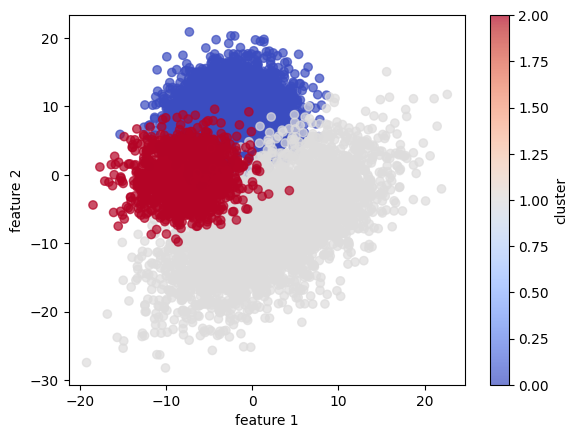

In [ ]:
plt.scatter(X[:,0],X[:,1],c=y,cmap='coolwarm',alpha=0.7)
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.colorbar(label="cluster")
plt.show()

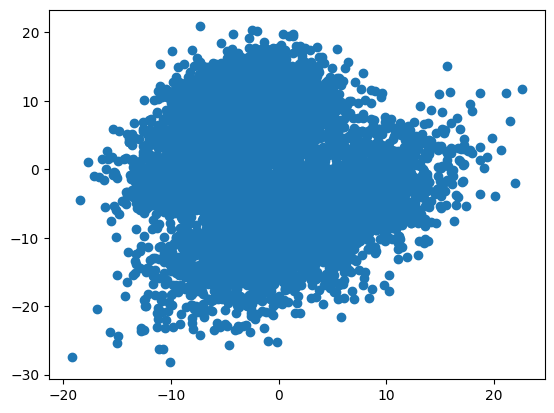

In [ ]:
plt.scatter(X[:,0],X[:,1])
plt.show()

In [ ]:
corr_dataset = pd.DataFrame(X) 

In [ ]:
corr_dataset.columns = [f"vab_{col+1}" for col in corr_dataset.columns]

In [ ]:
corr_dataset['target'] = y

In [ ]:
corr_dataset

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target
0,-4.751131,7.188739,2.606272,-1.378225,-7.583400,-5.931172,-11.465821,5.605739,4.304865,1.470071,...,6.548489,10.169870,-6.110733,-8.594018,-3.897743,-3.931554,0.913509,-2.709825,-0.162644,0
1,-0.725373,5.916493,3.397594,-4.316019,-9.319124,-14.695946,-11.158916,11.013022,7.437547,-2.351238,...,4.899855,3.368586,-5.592666,-6.021058,-7.070602,-4.351386,-4.122657,2.612512,-2.855615,0
2,-1.788551,11.577658,8.782610,-2.138870,-4.381382,-8.786046,-12.410454,6.136852,1.651485,0.498091,...,9.943814,0.898220,-4.448931,-6.322616,-6.673646,-4.507802,1.474381,0.831106,-7.072106,0
3,-1.967006,9.330073,2.335621,0.862168,-2.325414,-6.632699,-7.852450,7.568818,1.059404,1.921308,...,10.456896,8.353565,-8.220929,-7.132517,-6.068433,-4.455111,1.651339,3.680425,-1.011517,0
4,-3.384732,10.607922,0.032619,2.059355,-6.572006,-7.795838,-12.630250,7.808566,1.633789,6.171098,...,9.093324,2.421812,-4.294874,-5.827276,-6.967793,-1.561956,-1.075808,3.912938,-4.524384,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.251101,1.746316,-3.207504,9.774118,-4.418259,5.870652,-3.527866,7.626985,-0.605679,-7.382075,...,2.028634,11.946910,2.383709,4.992197,9.155754,-11.646443,-4.731030,-9.760470,-3.863895,2
9996,-4.336786,2.503536,-12.585057,7.243733,-8.596233,2.776974,-3.265002,4.933492,3.260359,-1.859947,...,9.839832,9.868386,11.379058,0.364884,11.278721,-7.426337,-5.165365,-11.334637,-3.283705,2
9997,-5.083141,-3.983264,-8.968644,10.522589,-5.101449,4.558384,-4.554582,0.068881,-1.715949,-9.213131,...,4.243401,7.257498,4.475025,1.906274,12.343497,-5.157161,-8.570983,-6.485044,-0.308675,2
9998,-11.756165,-0.738363,-10.832338,6.883618,-3.143228,3.946673,-3.621857,2.297664,0.783963,-5.576153,...,5.822131,3.196155,3.734084,3.978118,12.960398,-10.165578,-6.178761,-10.115746,-4.248784,2


In [ ]:
# sns.pairplot(corr_dataset)

## correlation matrix

In [ ]:
corr_dataset.iloc[:,:-1].corr()

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,vab_11,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20
vab_1,1.000000,-0.106504,0.234276,-0.118200,0.509554,0.396875,0.278132,0.163985,0.359064,-0.000404,0.148904,-0.203664,-0.290269,0.337659,0.473057,0.260462,0.476520,0.080693,0.659815,0.462360
vab_2,-0.106504,1.000000,0.681492,0.447666,-0.260582,-0.535002,-0.040782,0.679356,0.271804,0.816168,-0.462746,0.826508,0.755067,-0.582635,-0.606474,-0.522694,0.245605,0.736620,-0.089510,-0.020577
vab_3,0.234276,0.681492,1.000000,0.157206,-0.053996,-0.396151,-0.051508,0.666951,0.345155,0.724880,-0.514219,0.565907,0.413730,-0.472856,-0.377684,-0.486267,0.427635,0.665519,0.287430,0.124231
vab_4,-0.118200,0.447666,0.157206,1.000000,0.055149,0.039905,0.358800,0.348091,0.318532,0.363666,0.243608,0.552220,0.638540,0.042434,-0.097934,0.140542,0.154795,0.389418,-0.196114,0.187918
vab_5,0.509554,-0.260582,-0.053996,0.055149,1.000000,0.611782,0.466083,-0.011124,0.344533,-0.198917,0.502842,-0.270112,-0.252920,0.599476,0.646401,0.558586,0.361203,-0.083266,0.489545,0.504469
vab_6,0.396875,-0.535002,-0.396151,0.039905,0.611782,1.000000,0.512532,-0.284704,0.204395,-0.496531,0.751434,-0.480049,-0.387819,0.814930,0.801871,0.789811,0.175920,-0.350842,0.330933,0.461194
vab_7,0.278132,-0.040782,-0.051508,0.358800,0.466083,0.512532,1.000000,0.096517,0.366929,-0.047197,0.543935,0.016887,0.089400,0.507448,0.462822,0.537445,0.293559,0.060515,0.225411,0.447425
vab_8,0.163985,0.679356,0.666951,0.348091,-0.011124,-0.284704,0.096517,1.000000,0.380871,0.697318,-0.314782,0.624679,0.537361,-0.346317,-0.312714,-0.322513,0.404979,0.656844,0.176964,0.184677
vab_9,0.359064,0.271804,0.345155,0.318532,0.344533,0.204395,0.366929,0.380871,1.000000,0.303912,0.153759,0.256265,0.226128,0.167090,0.190675,0.174015,0.442063,0.358304,0.347178,0.408893
vab_10,-0.000404,0.816168,0.724880,0.363666,-0.198917,-0.496531,-0.047197,0.697318,0.303912,1.000000,-0.485238,0.765702,0.665130,-0.552560,-0.542361,-0.513367,0.317024,0.730460,0.025146,0.029453


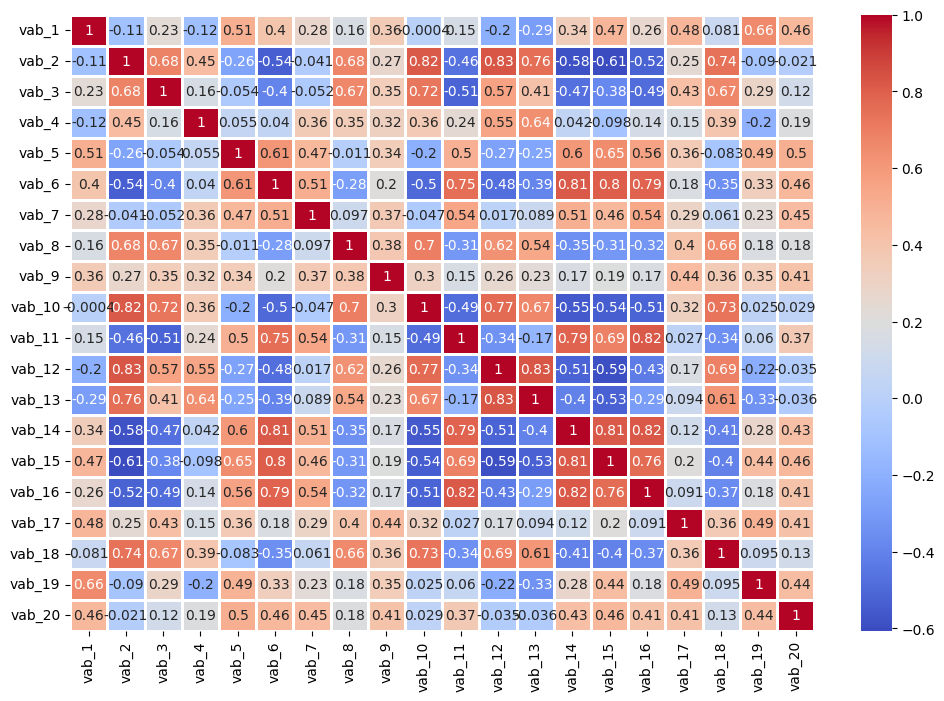

In [ ]:
plt.figure(figsize=(12,8))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='coolwarm',annot=True,linewidths=1)
plt.show()

## data standardization

In [ ]:
X_values = corr_dataset.iloc[:,:-1].values

In [ ]:
y_values = corr_dataset.iloc[:,-1].values

In [ ]:
scaler = StandardScaler()

In [ ]:
X_values = scaler.fit_transform(X_values)

In [ ]:
np.mean(X_values),np.std(X_values)

(3.812443021655103e-17, 0.9999999999999997)

In [ ]:
pd.DataFrame(X_values)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-0.495310,1.161509,1.662876,0.084813,0.131350,-1.243167,-0.836062,0.289762,-0.254385,1.318320,-1.754333,0.998620,0.221652,-0.861485,-1.371996,-1.789344,0.915798,1.080639,0.407891,-1.709141
1,0.660417,0.892542,0.292137,-1.183957,-1.330653,-2.240696,-0.582780,0.949742,0.042107,0.734100,-1.642982,0.274726,0.448925,-1.452595,-1.450772,-2.034699,0.800904,0.461054,0.000006,-0.197009
2,-0.018634,0.987113,1.364026,0.098721,-0.716618,-1.395415,-0.144139,0.372261,0.243843,1.305553,-0.947114,0.993987,0.320256,-0.941878,-0.761212,-1.878202,0.505335,0.955997,0.638891,0.494228
3,0.151921,0.929270,1.043987,0.296690,-0.645007,-0.821242,0.003308,1.187307,0.265509,0.916435,-2.061239,0.919670,0.538790,-1.673843,-0.739816,-1.493843,0.505351,1.142580,1.095620,1.081148
4,0.471858,1.174735,1.420572,-0.112000,0.008975,-0.848943,-0.258481,1.343385,0.662700,1.626698,-0.369843,1.346643,0.072449,-1.246440,-1.338941,-1.218993,0.517130,0.907144,0.364460,-0.196000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-0.402802,-0.568919,-0.932356,1.165816,0.702080,1.068312,-0.323014,-1.201932,1.980331,-1.211540,0.765409,0.522131,0.563808,0.435481,0.051196,0.805057,1.561632,-0.686439,-0.975109,-0.483799
9995,-1.405073,-0.383784,-1.184889,1.097459,-0.349107,0.280283,1.987680,-1.299744,-1.108424,-0.675785,0.741294,-0.361993,0.340861,1.136414,0.255861,-0.118609,0.263716,-1.416592,-1.004410,0.129024
9996,-2.459343,-0.716734,-0.820803,-0.060713,-0.133641,0.131824,0.552281,-0.708078,-0.014217,-0.341436,0.197922,1.145504,0.806391,0.702863,-0.462630,0.081821,0.451343,0.665713,-2.033484,-0.237985
9997,-0.554271,0.359124,-0.366327,0.831280,0.177552,0.617976,0.392079,-1.144454,1.180675,-0.495059,1.059126,0.967608,1.266715,1.450970,-0.229400,0.431421,-1.794792,-0.317100,-1.821337,0.701716


<Axes: ylabel='Density'>

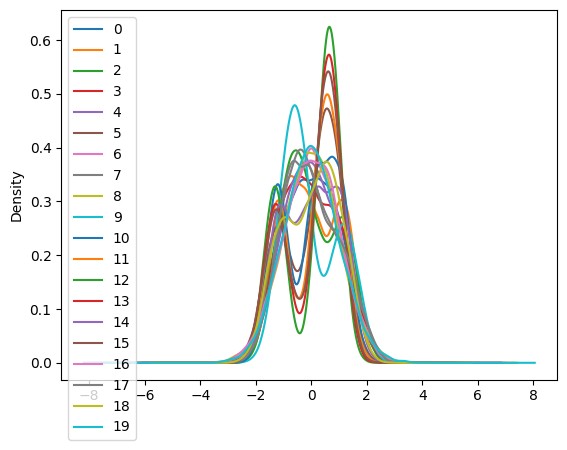

In [ ]:
pd.DataFrame(X_values).plot(kind='density')

## pca 

In [ ]:
pca_general = PCA()

In [ ]:
pca_general.fit(X_values)

PCA()

In [ ]:
explained_variance = pca_general.explained_variance_ratio_

In [ ]:
explained_variance

array([0.42379423, 0.21952016, 0.06012051, 0.04245463, 0.03519996,
       0.03022626, 0.02931484, 0.0220726 , 0.02080183, 0.01718241,
       0.01428259, 0.01279622, 0.01110434, 0.01076658, 0.01037815,
       0.00901422, 0.00840611, 0.00827311, 0.00752886, 0.00676239])

In [ ]:
eigenvalues = pca_general.explained_variance_

In [ ]:
pd.DataFrame(eigenvalues)

,0
0,8.476732
1,4.390842
2,1.202531
3,0.849178
4,0.704070
5,0.604586
6,0.586355
7,0.441496
8,0.416078
9,0.343682


In [ ]:
eigenvectors = pca_general.components_

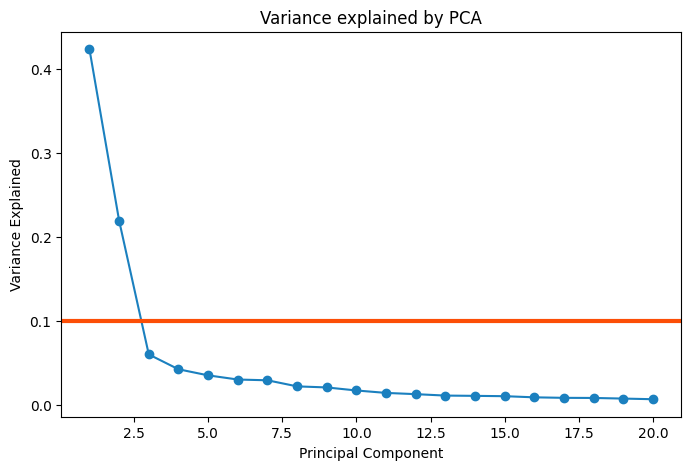

In [ ]:
plt.figure(figsize=(8,5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [ ]:
pca = PCA(n_components=3)

In [ ]:
principal_components = pca.fit_transform(X_values)

In [ ]:
pd.DataFrame(principal_components).head(8)

,0,1,2
0,-4.210498,0.968075,-0.781582
1,-3.970238,1.530426,-0.744506
2,-3.545991,0.965251,0.572056
3,-3.702889,1.411522,1.015926
4,-3.681578,1.007838,0.954405
5,-3.123265,0.888352,1.759773
6,-3.894561,0.076308,-1.320478
7,-2.845299,-0.240502,-0.782397


In [ ]:
principal_df = pd.DataFrame(data = principal_components,columns = ['principal component 1','principal component 2','principal component 3'])

In [ ]:
final_df = pd.concat([principal_df,corr_dataset[['target']]],axis = 1)

In [ ]:
final_df

,principal component 1,principal component 2,principal component 3,target
0,-4.210498,0.968075,-0.781582,0
1,-3.970238,1.530426,-0.744506,0
2,-3.545991,0.965251,0.572056,0
3,-3.702889,1.411522,1.015926,0
4,-3.681578,1.007838,0.954405,0
...,...,...,...,...
9994,1.690582,-1.343954,1.462309,2
9995,2.076124,-2.525347,-0.325004,2
9996,0.009616,-2.721187,0.069194,2
9997,1.052045,-3.082883,1.193430,2


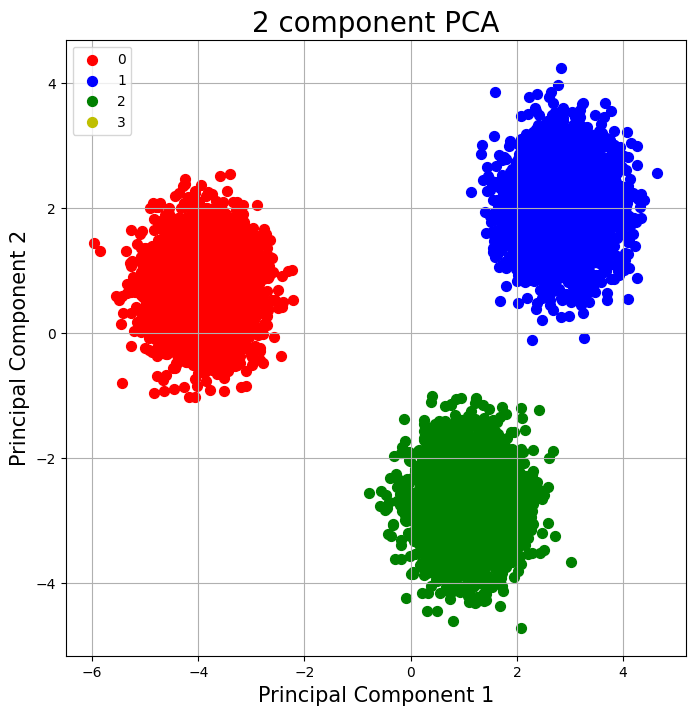

In [ ]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

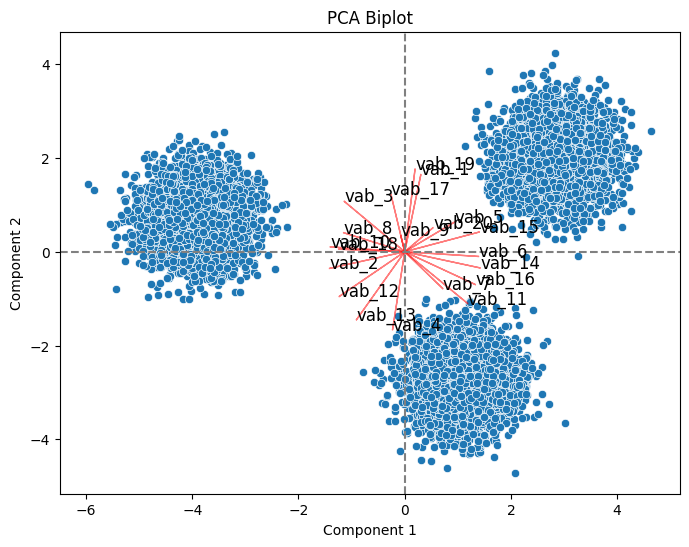

In [ ]:
scores = pca.transform(X_values)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=scores[:, 0], y=scores[:, 1])
for i, col in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.arrow(0, 0, eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), color='r', alpha=0.5)
    plt.text(eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), col, fontsize=12)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('PCA Biplot')
plt.axhline(0, color='gray', linestyle='--')
plt.axvline(0, color='gray', linestyle='--')
plt.show()

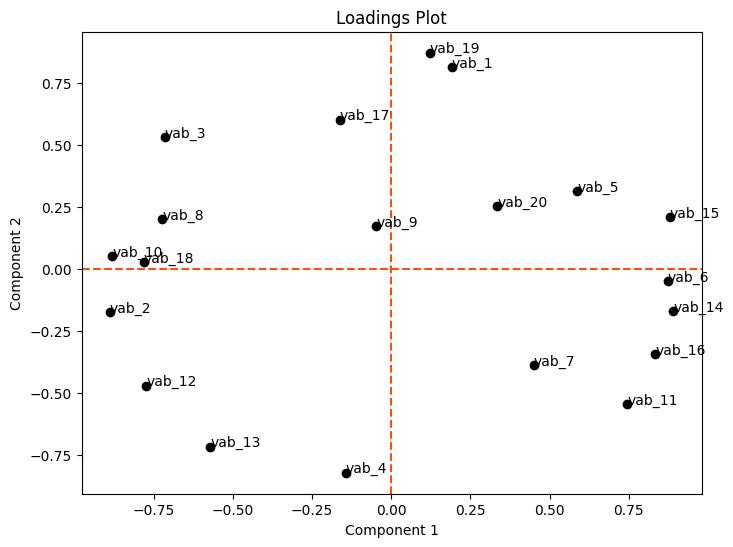

In [ ]:
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
plt.figure(figsize=(8, 6))
plt.scatter(loadings[:, 0], loadings[:, 1], color='black')
for i, txt in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.text(loadings[i, 0], loadings[i, 1], txt, fontsize=10)
plt.axhline(0, color='#FC4E07', linestyle='--')
plt.axvline(0, color='#FC4E07', linestyle='--')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('Loadings Plot')
plt.show()

In [ ]:
X_pca = pca.transform(X_values)

In [ ]:
pd.DataFrame(X_pca).head()

,0,1,2
0,-4.210498,0.968075,-0.781582
1,-3.970238,1.530426,-0.744506
2,-3.545991,0.965251,0.572056
3,-3.702889,1.411522,1.015926
4,-3.681578,1.007838,0.954405


## t-SNE

In [ ]:
tsne = TSNE(n_components=3,random_state=42)

In [ ]:
X_tsne = tsne.fit_transform(X_values)

In [ ]:
tsne_data = pd.concat([pd.DataFrame(X_tsne,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [ ]:
tsne_data

,dim_1,dim_2,dim_3,target
0,-15.092319,16.216047,12.639448,0
1,-11.869372,4.358335,-8.940348,0
2,-21.100210,-5.082855,-8.502220,0
3,-23.704796,-6.241185,-10.709100,0
4,-33.460041,-3.884725,-8.431009,0
...,...,...,...,...
9994,-18.528011,-19.489685,9.558980,2
9995,14.114757,-5.114896,-18.513199,2
9996,8.924138,-19.059849,3.610985,2
9997,-4.785365,-26.580540,-9.254801,2


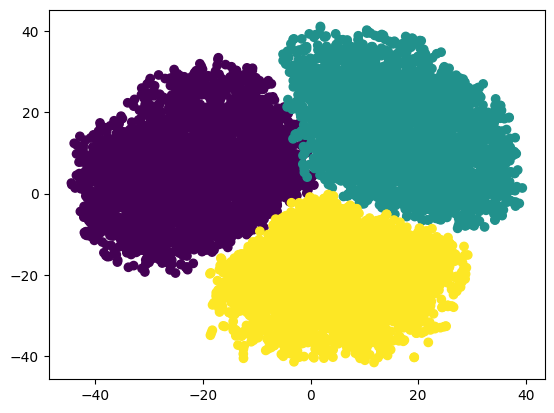

In [ ]:
plt.scatter(x=tsne_data['dim_1'],y=tsne_data['dim_2'],c=tsne_data['target'])
plt.show()

In [ ]:
tsne.kl_divergence_

2.7012977600097656

## umap

In [ ]:
umap = umap.UMAP(n_components=3,random_state=42)

In [ ]:
X_umap = umap.fit_transform(X_values)

In [ ]:
umap_data = pd.concat([pd.DataFrame(X_umap,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [ ]:
umap_data

,dim_1,dim_2,dim_3,target
0,13.128295,-0.698574,6.222317,0
1,13.241578,-1.332387,5.799850,0
2,14.179639,-1.341763,5.159748,0
3,14.285381,-1.287446,4.919124,0
4,14.087510,-0.538787,5.168782,0
...,...,...,...,...
9994,-3.614810,2.112525,3.428145,2
9995,-3.409654,1.016156,4.725813,2
9996,-4.020553,1.516089,4.401618,2
9997,-3.319084,2.665249,4.462997,2


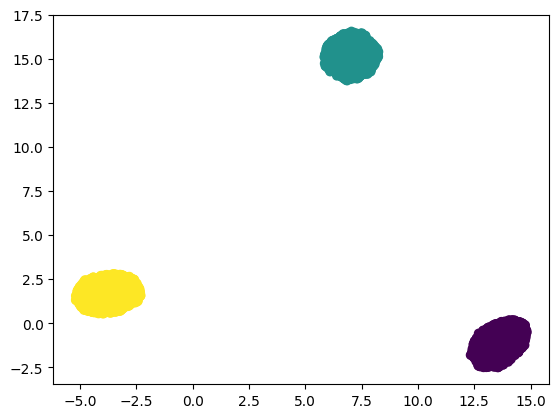

In [ ]:
plt.scatter(umap_data['dim_1'],umap_data['dim_2'],c=umap_data['target'])
plt.show()

## k-means 

In [ ]:
kmeans = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [ ]:
kmeans.fit(X_values)

KMeans(n_clusters=3, random_state=42)

In [ ]:
df_kmeans = corr_dataset.copy()

In [ ]:
df_kmeans['k_means'] = kmeans.labels_

In [ ]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,2
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,2
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,1
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,1
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,1
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,1


In [ ]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [ ]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


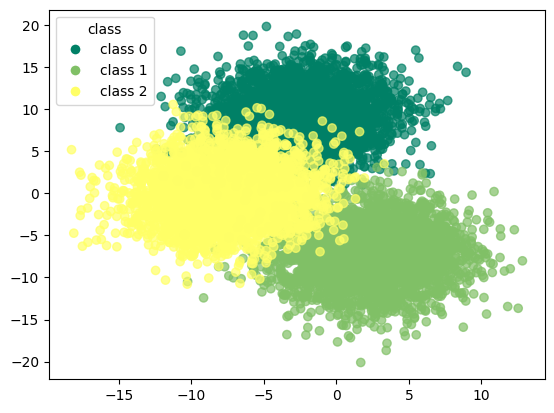

In [ ]:
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

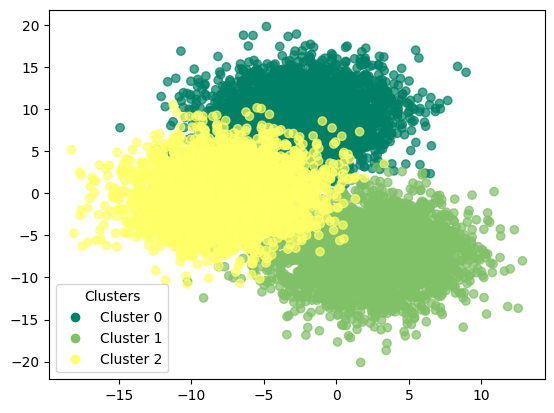

In [ ]:
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
kmeans.cluster_centers_

array([[ 0.95501043, -1.05990757, -0.18467896, -0.95216698,  0.82060342,
         0.79607234,  0.05189714, -0.50953478,  0.08858066, -0.81999477,
         0.17625607, -1.24508231, -1.30255281,  0.69990828,  1.0687009 ,
         0.46686771,  0.3715359 , -0.73407159,  0.9728878 ,  0.50510369],
       [-0.97658516, -0.08581553, -0.96863943,  1.0414553 , -0.16062926,
         0.40333641,  0.64850264, -0.50748958, -0.19595987, -0.39168048,
         1.03797545,  0.3592755 ,  0.78039196,  0.57479836,  0.05462788,
         0.79002428, -0.76587601, -0.30888016, -1.10990005, -0.15924856],
       [ 0.02157473,  1.1457231 ,  1.15331839, -0.08928832, -0.65997416,
        -1.19940875, -0.70039978,  1.01702436,  0.10737921,  1.21167525,
        -1.21423152,  0.8858068 ,  0.52216084, -1.27470664, -1.12332878,
        -1.25689198,  0.39434011,  1.04295175,  0.13701225, -0.34585512]])

In [ ]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



### k-means with pca

In [ ]:
kmeans_pca = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [ ]:
kmeans_pca.fit(X_pca)

KMeans(n_clusters=3, random_state=42)

In [ ]:
df_pca_kmeans = corr_dataset.copy()

In [ ]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [ ]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,1
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,1
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,0
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,0
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,0
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,0


In [ ]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.0
accuracy after: 0.5041504150415042


In [ ]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,1
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,1
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,1
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,1


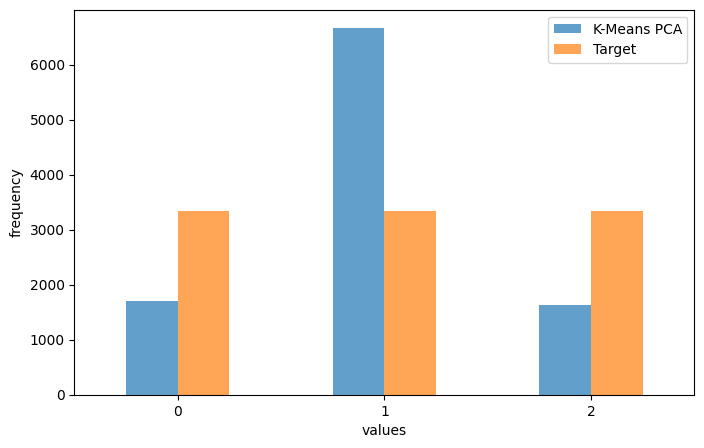

In [ ]:
counts_kmeans = df_pca_kmeans['kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [ ]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[1708    0 1625]
 [   0 3333    0]
 [   0 3333    0]]


In [ ]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      0.51      0.68      3333
           1       0.50      1.00      0.67      3333
           2       0.00      0.00      0.00      3333

    accuracy                           0.50      9999
   macro avg       0.50      0.50      0.45      9999
weighted avg       0.50      0.50      0.45      9999



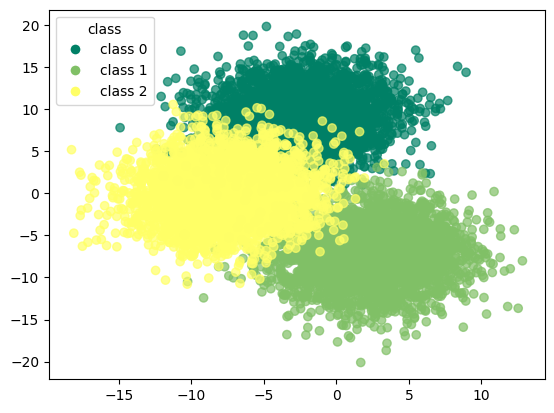

In [ ]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

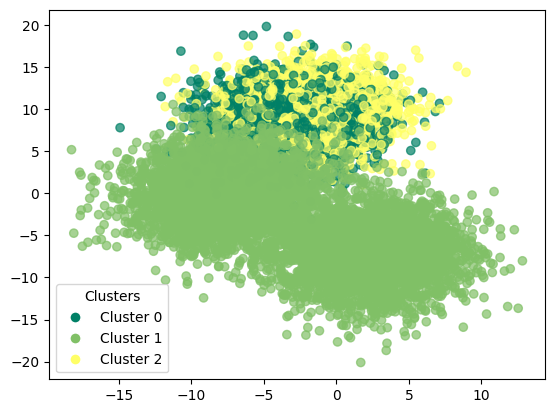

In [ ]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

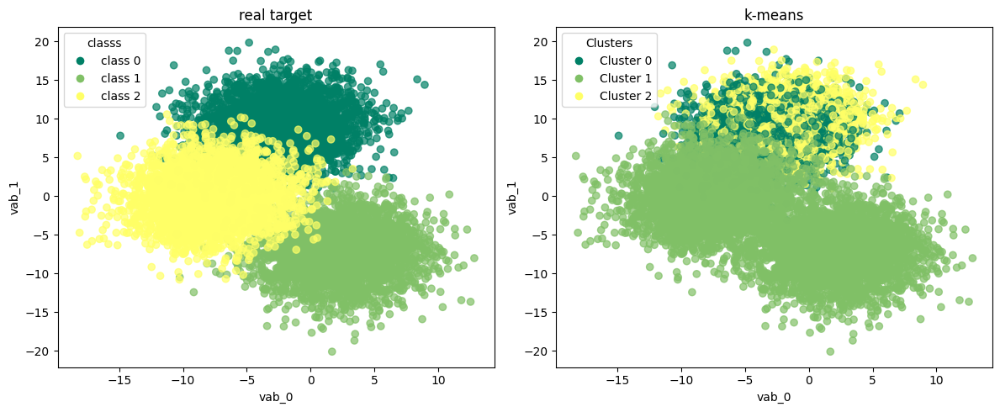

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

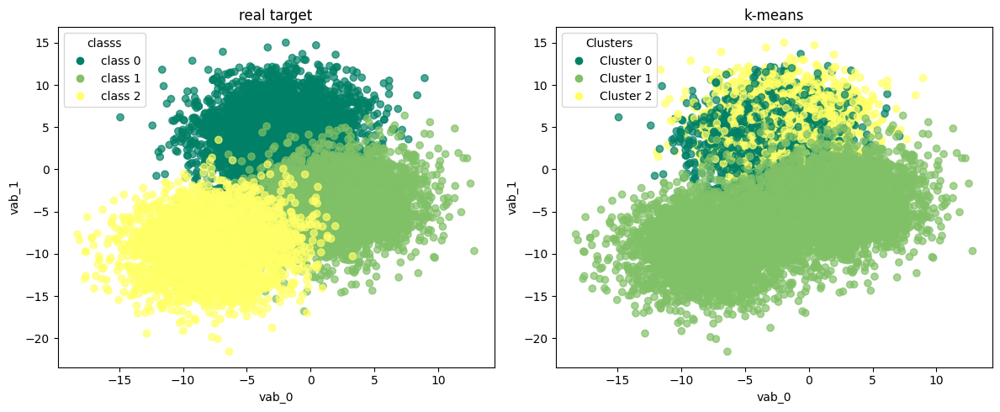

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

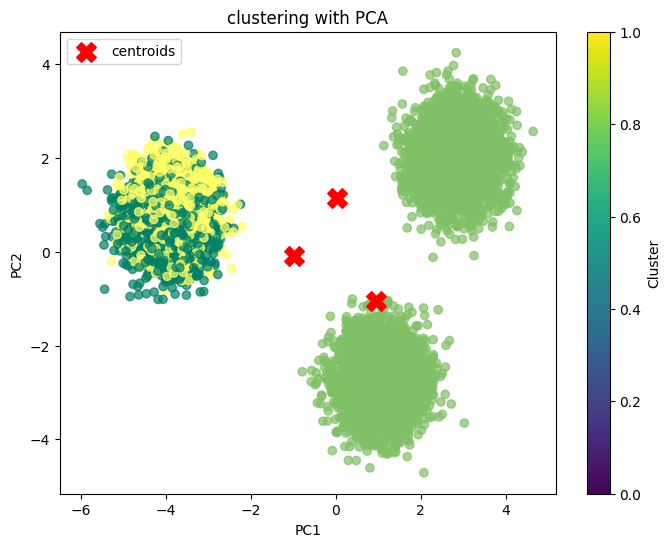

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(final_df['principal component 1'], final_df['principal component 2'] , c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
            c='red', marker='X', s=200, label='centroids')

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('clustering with PCA')
plt.colorbar(label='Cluster')
plt.legend()
plt.show()

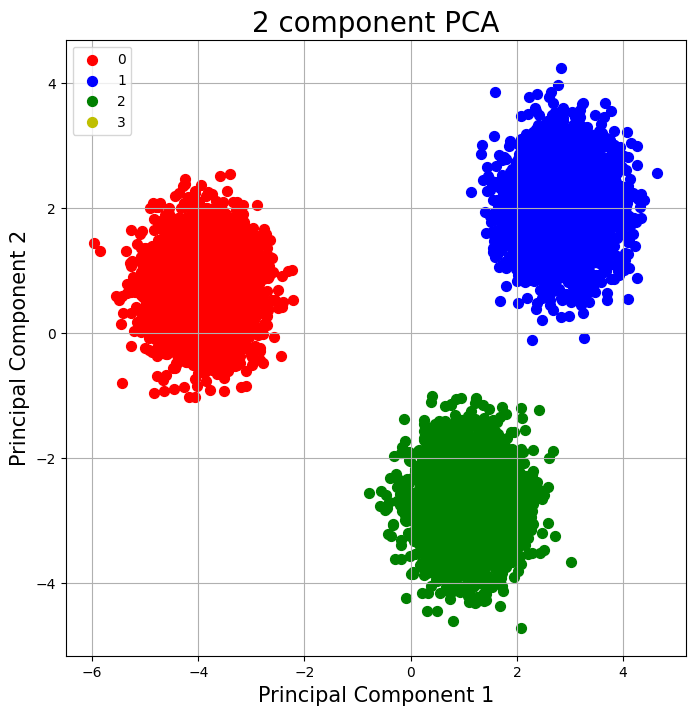

In [ ]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

### k-means with t-SNE

In [ ]:
kmeans_tsne = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [ ]:
kmeans_tsne.fit(X_tsne)

KMeans(n_clusters=3, random_state=42)

In [ ]:
df_tsne_kmeans = corr_dataset.copy()

In [ ]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [ ]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,2
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,2
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,1
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,1
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,1
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,1


In [ ]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.0033003300330033004
accuracy after: 0.9964996499649965


In [ ]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


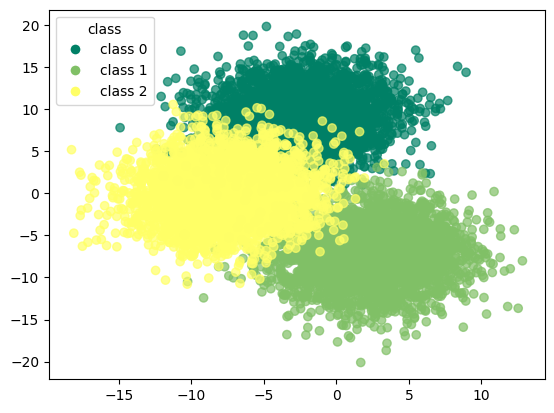

In [ ]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

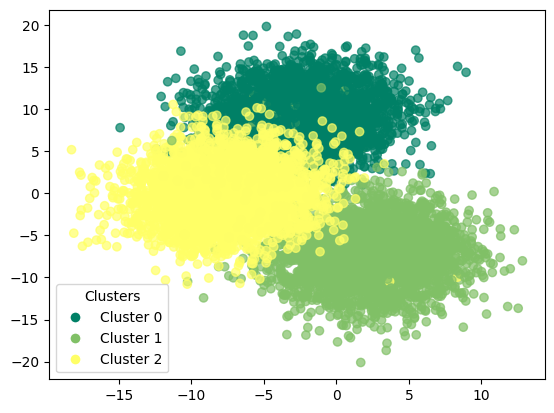

In [ ]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

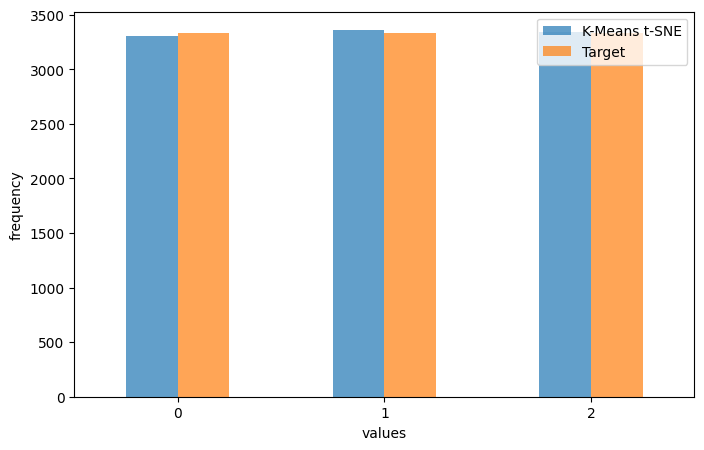

In [ ]:
counts_kmeans = df_tsne_kmeans['kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [ ]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[3303   29    1]
 [   0 3329    4]
 [   0    1 3332]]


In [ ]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      3333
           1       0.99      1.00      0.99      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



### k-means with umap

In [ ]:
kmeans_umap = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [ ]:
kmeans_umap.fit(X_umap)

KMeans(n_clusters=3, random_state=42)

In [ ]:
df_umap_kmeans = corr_dataset.copy()

In [ ]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [ ]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,2
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,2
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,1
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,1
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,1
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,1


In [ ]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [ ]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


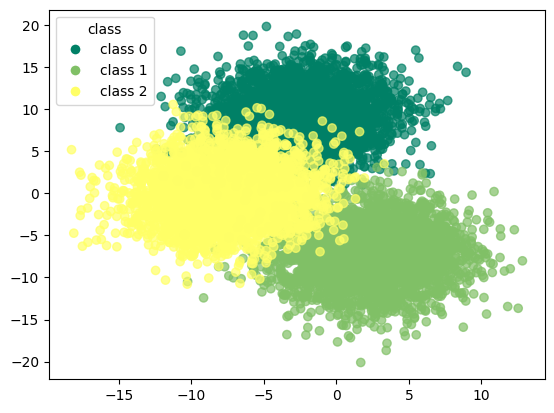

In [ ]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

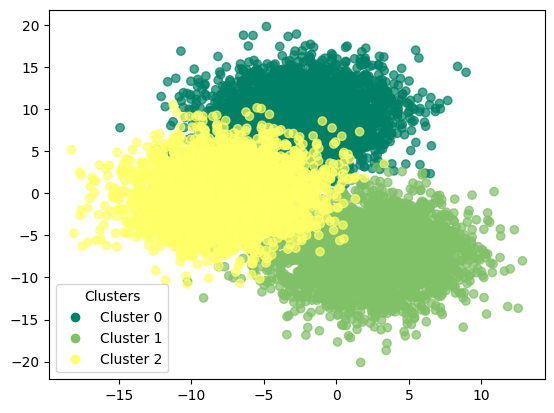

In [ ]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

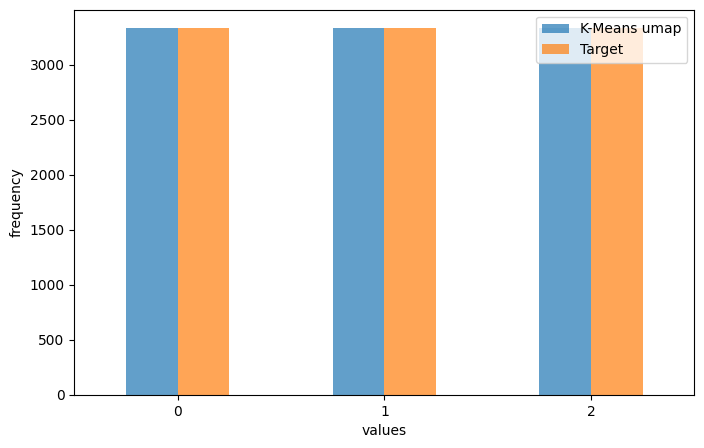

In [ ]:
counts_kmeans = df_umap_kmeans['kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [ ]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## trimmed k-means

In [ ]:
def trimmed_clustering(X,n_clusters,trim_fraction=0.1):

    kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(X)
    distances = np.min(kmeans.transform(X),axis=1)
    
    trim_threshold = np.percentile(distances,100 * (1 - trim_fraction))
    trimmed_X = X[distances < trim_threshold]
    trimmed_indices = np.where(distances < trim_threshold)[0]
    trimmed_kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(trimmed_X)
    
    return trimmed_kmeans,trimmed_indices

In [ ]:
trimmed_kmeans,trimmmed_indces = trimmed_clustering(X_values,n_clusters=3,trim_fraction=0.1)

In [ ]:
trimmed_kmeans

KMeans(n_clusters=3, random_state=42)

In [ ]:
df_trim_kmeans = corr_dataset.copy()

In [ ]:
df_trim_kmeans = df_trim_kmeans.iloc[trimmmed_indces]  

In [ ]:
df_trim_kmeans['trim_kmeans'] = trimmed_kmeans.labels_

In [ ]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,2
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,2
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9993,0.806938,4.640702,-8.727424,2.220968,1.476951,2.546981,-0.373525,0.952893,0.808748,-4.889288,...,10.960830,7.115181,-0.567204,11.980898,-9.595910,-8.772155,-9.063175,-3.238362,2,1
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,1
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,1
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,1


In [ ]:
y_true = df_trim_kmeans['target'].values  
y_kmeans = df_trim_kmeans['trim_kmeans'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_trim_kmeans['trim_kmeans'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_trim_kmeans['trim_kmeans'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [ ]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9993,0.806938,4.640702,-8.727424,2.220968,1.476951,2.546981,-0.373525,0.952893,0.808748,-4.889288,...,10.960830,7.115181,-0.567204,11.980898,-9.595910,-8.772155,-9.063175,-3.238362,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


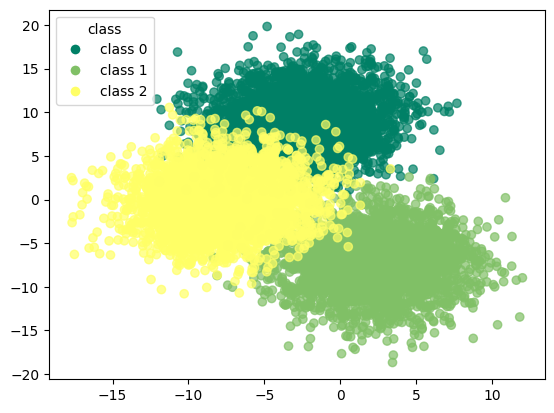

In [ ]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

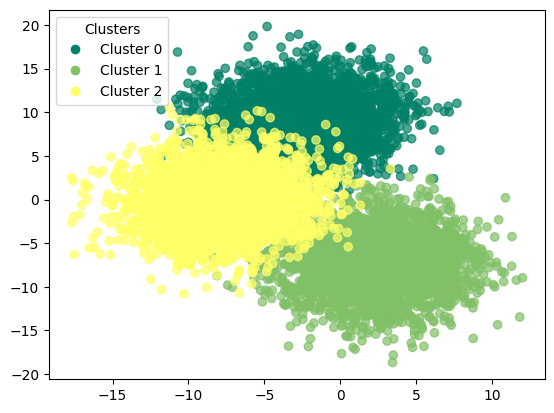

In [ ]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['trim_kmeans'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_trim_kmeans['trim_kmeans'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[3001    0    0]
 [   0 2968    0]
 [   0    0 3030]]


In [ ]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3001
           1       1.00      1.00      1.00      2968
           2       1.00      1.00      1.00      3030

    accuracy                           1.00      8999
   macro avg       1.00      1.00      1.00      8999
weighted avg       1.00      1.00      1.00      8999



### trimmed k-means with pca

In [ ]:
trim_kmeans_pca,trimmmed_indices = trimmed_clustering(X_pca,n_clusters=3,trim_fraction=0.1)

In [ ]:
trim_kmeans_pca

KMeans(n_clusters=3, random_state=42)

In [ ]:
df_pca_trim_kmeans = corr_dataset.copy()

In [ ]:
df_pca_trim_kmeans = df_pca_trim_kmeans.iloc[trimmmed_indces]  

In [ ]:
df_pca_trim_kmeans["trim_kmeans_pca"] = trim_kmeans_pca.labels_

In [ ]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,1
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,1
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,1
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,1
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9993,0.806938,4.640702,-8.727424,2.220968,1.476951,2.546981,-0.373525,0.952893,0.808748,-4.889288,...,10.960830,7.115181,-0.567204,11.980898,-9.595910,-8.772155,-9.063175,-3.238362,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


In [ ]:
y_true = df_pca_trim_kmeans['target'].values  
y_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_trim_kmeans['trim_kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_trim_kmeans['trim_kmeans_pca'] == y_true))

accuracy before: 0.35515057228580954
accuracy after: 0.9448827647516391


In [ ]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9993,0.806938,4.640702,-8.727424,2.220968,1.476951,2.546981,-0.373525,0.952893,0.808748,-4.889288,...,10.960830,7.115181,-0.567204,11.980898,-9.595910,-8.772155,-9.063175,-3.238362,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


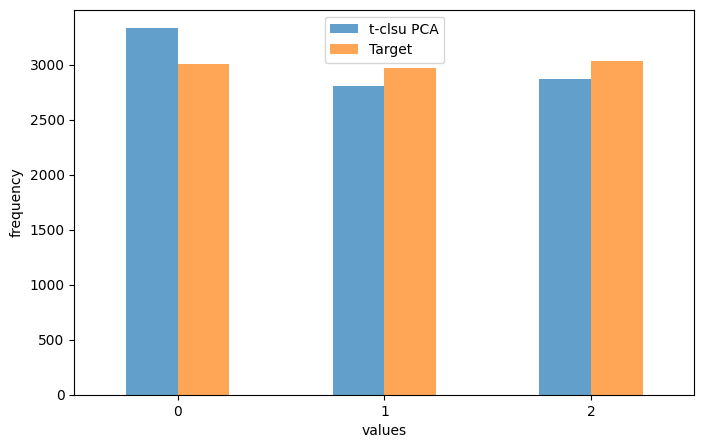

In [ ]:
counts_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'t-clust PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["t-clsu PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [ ]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[3001    0    0]
 [ 331 2637    0]
 [   0  165 2865]]


In [ ]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.90      1.00      0.95      3001
           1       0.94      0.89      0.91      2968
           2       1.00      0.95      0.97      3030

    accuracy                           0.94      8999
   macro avg       0.95      0.94      0.94      8999
weighted avg       0.95      0.94      0.94      8999



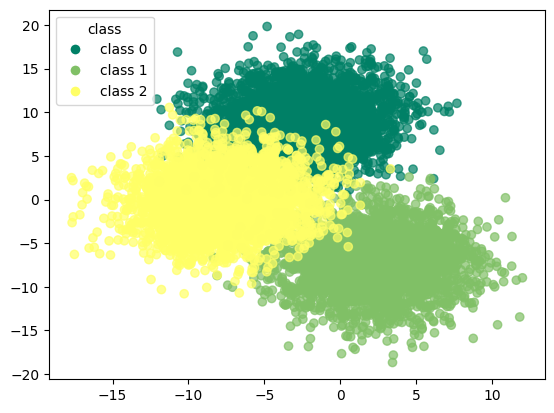

In [ ]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

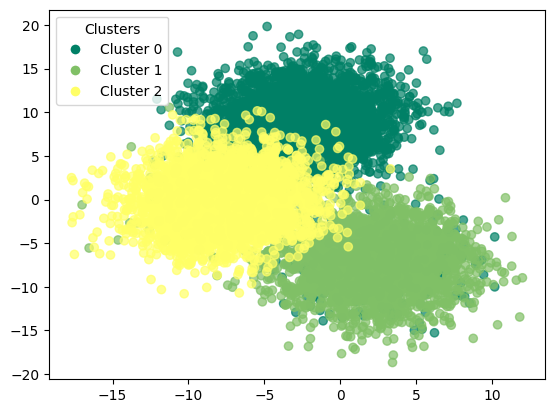

In [ ]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

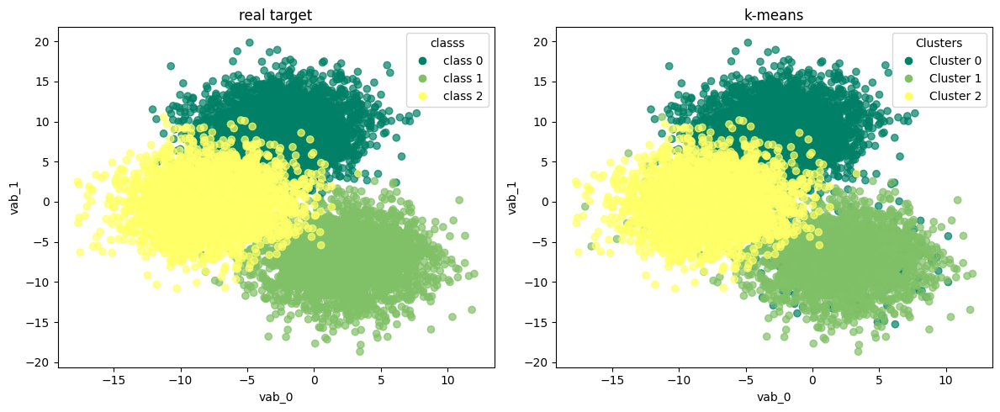

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

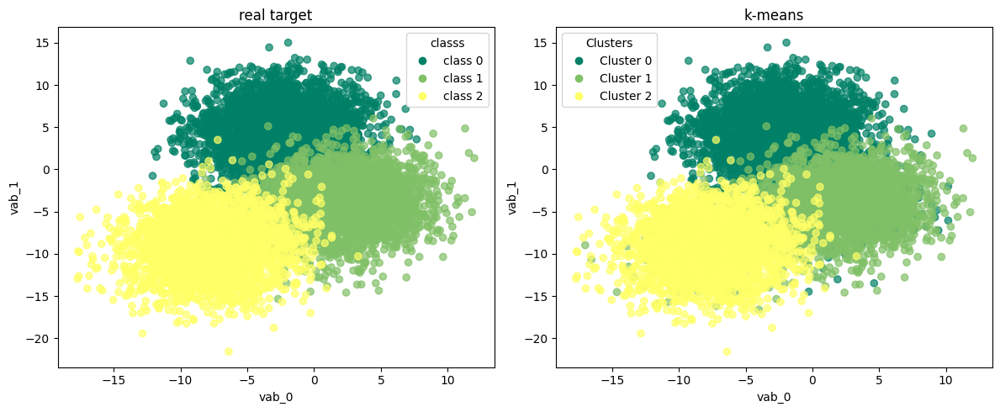

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

### trimmed k-means with t-SNE

In [ ]:
trim_kmeans_tsne,trimmmed_indices = trimmed_clustering(X_tsne,n_clusters=3,trim_fraction=0.1)

In [ ]:
trim_kmeans_tsne

KMeans(n_clusters=3, random_state=42)

In [ ]:
df_tsne_trim_kmeans = corr_dataset.copy()

In [ ]:
df_tsne_trim_kmeans = df_tsne_trim_kmeans.iloc[trimmmed_indces]  

In [ ]:
df_tsne_trim_kmeans['trim_kmeans_tsne'] = trim_kmeans_tsne.labels_

In [ ]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,2
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,2
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9993,0.806938,4.640702,-8.727424,2.220968,1.476951,2.546981,-0.373525,0.952893,0.808748,-4.889288,...,10.960830,7.115181,-0.567204,11.980898,-9.595910,-8.772155,-9.063175,-3.238362,2,1
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,1
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,1
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,1


In [ ]:
y_true = df_tsne_trim_kmeans['target'].values  
y_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_trim_kmeans['trim_kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_trim_kmeans['trim_kmeans_tsne'] == y_true))

accuracy before: 0.00333370374486054
accuracy after: 0.9811090121124569


In [ ]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9993,0.806938,4.640702,-8.727424,2.220968,1.476951,2.546981,-0.373525,0.952893,0.808748,-4.889288,...,10.960830,7.115181,-0.567204,11.980898,-9.595910,-8.772155,-9.063175,-3.238362,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


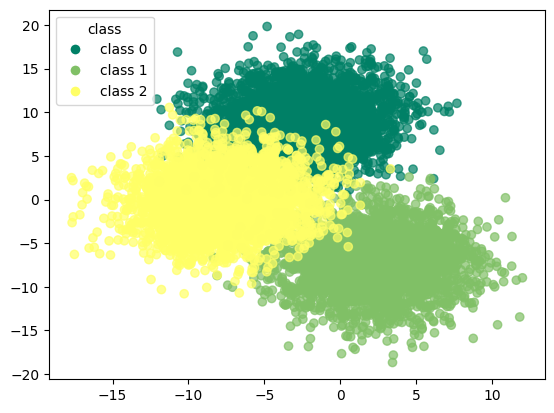

In [ ]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

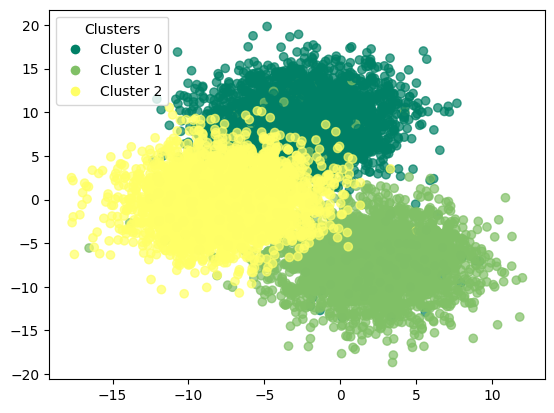

In [ ]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['trim_kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_trim_kmeans['trim_kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

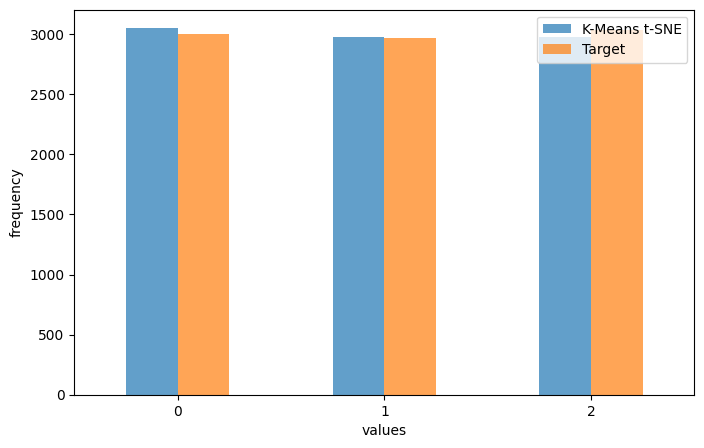

In [ ]:
counts_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [ ]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne']))

[[2973   27    1]
 [  77 2888    3]
 [   0   62 2968]]


In [ ]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      3001
           1       0.97      0.97      0.97      2968
           2       1.00      0.98      0.99      3030

    accuracy                           0.98      8999
   macro avg       0.98      0.98      0.98      8999
weighted avg       0.98      0.98      0.98      8999



### trimmed k-means with umap

In [ ]:
trim_kmeans_umap,trimmmed_indices = trimmed_clustering(X_umap,n_clusters=3,trim_fraction=0.1)

In [ ]:
trim_kmeans_umap

KMeans(n_clusters=3, random_state=42)

In [ ]:
df_umap_trim_kmeans = corr_dataset.copy()

In [ ]:
df_umap_trim_kmeans = df_umap_trim_kmeans.iloc[trimmmed_indices]

In [ ]:
df_umap_trim_kmeans['trim_kmeans_umap'] = trim_kmeans_umap.labels_

In [ ]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,2
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,2
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,1
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,1
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,1
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,1


In [ ]:
y_true = df_umap_trim_kmeans['target'].values  
y_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_trim_kmeans['trim_kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_trim_kmeans['trim_kmeans_umap'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [ ]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


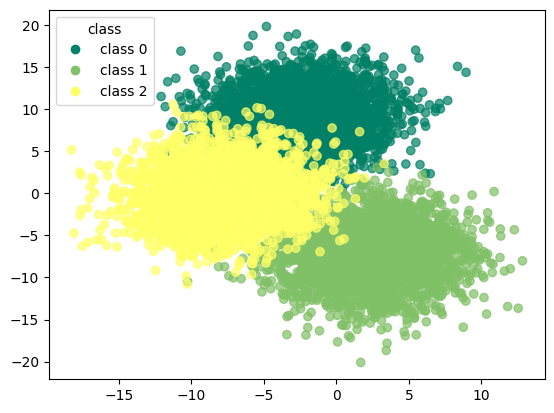

In [ ]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

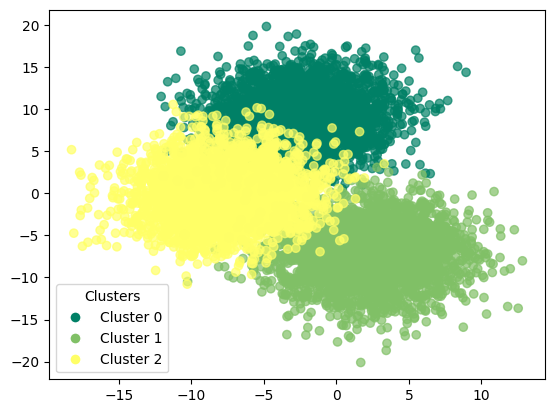

In [ ]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['trim_kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_trim_kmeans['trim_kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

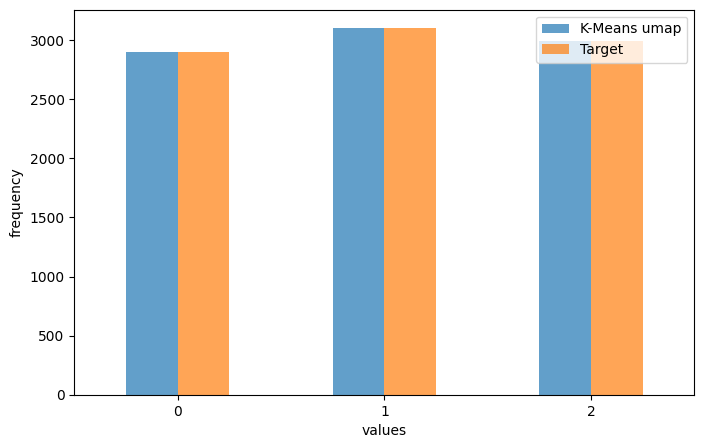

In [ ]:
counts_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [ ]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap']))

[[2903    0    0]
 [   0 3102    0]
 [   0    0 2994]]


In [ ]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2903
           1       1.00      1.00      1.00      3102
           2       1.00      1.00      1.00      2994

    accuracy                           1.00      8999
   macro avg       1.00      1.00      1.00      8999
weighted avg       1.00      1.00      1.00      8999



## dbscan

In [ ]:
def plot_k_distance_graph(X, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)
    distances = np.sort(distances[:, k-1])
    plt.figure(figsize=(10, 6))
    plt.plot(distances)
    plt.xlabel('Points')
    plt.ylabel(f'{k}-th nearest neighbor distance')
    plt.title('K-distance Graph')
    plt.show()

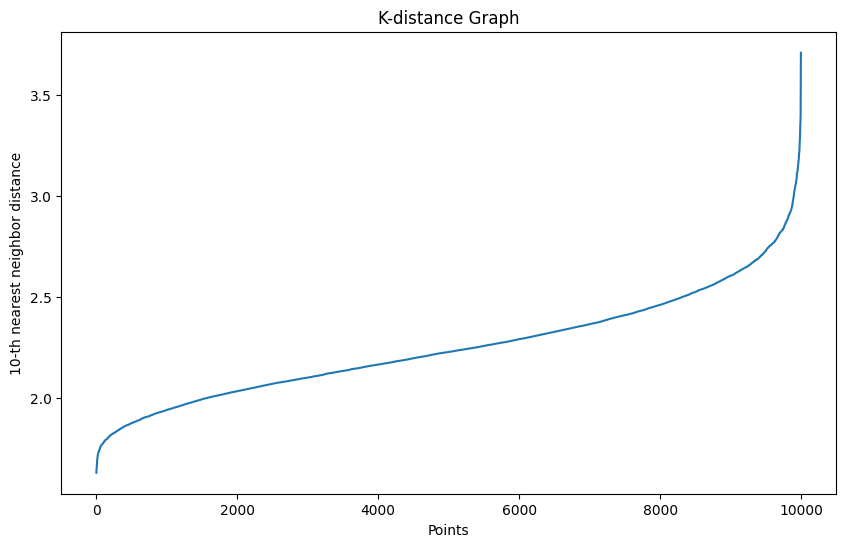

In [ ]:
plot_k_distance_graph(X_values,k=10) 

In [ ]:
dbscan = DBSCAN(eps=0.9,min_samples=10) # min_samples = 2*n_features

In [ ]:
dbscan.fit(X_values)

DBSCAN(eps=0.9, min_samples=10)

In [ ]:
df_dbscan = corr_dataset.copy()

In [ ]:
df_dbscan['dbscan'] = dbscan.labels_

In [ ]:
y_true = df_dbscan['target'].values  
y_kmeans = df_dbscan['dbscan'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_dbscan['dbscan'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_dbscan['dbscan'] == y_true))

accuracy before: 0.0
accuracy after: 0.0


In [ ]:
df_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,-1
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,-1
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,-1
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,-1
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,-1
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,-1
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,-1
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,-1


In [ ]:
print(df_dbscan['dbscan'].value_counts())

dbscan
-1    9999
Name: count, dtype: int64


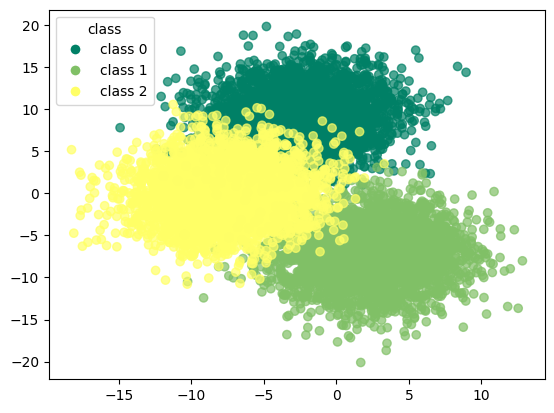

In [ ]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

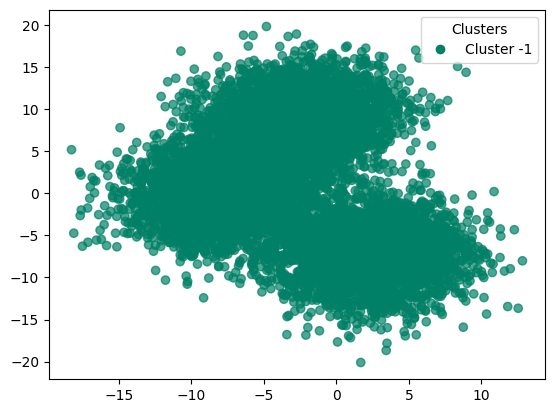

In [ ]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['dbscan'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_dbscan['dbscan'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0]
 [3333    0    0    0]
 [3333    0    0    0]
 [3333    0    0    0]]


In [ ]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    3333.0
           1       0.00      0.00      0.00    3333.0
           2       0.00      0.00      0.00    3333.0

    accuracy                           0.00    9999.0
   macro avg       0.00      0.00      0.00    9999.0
weighted avg       0.00      0.00      0.00    9999.0



### dbscan with pca

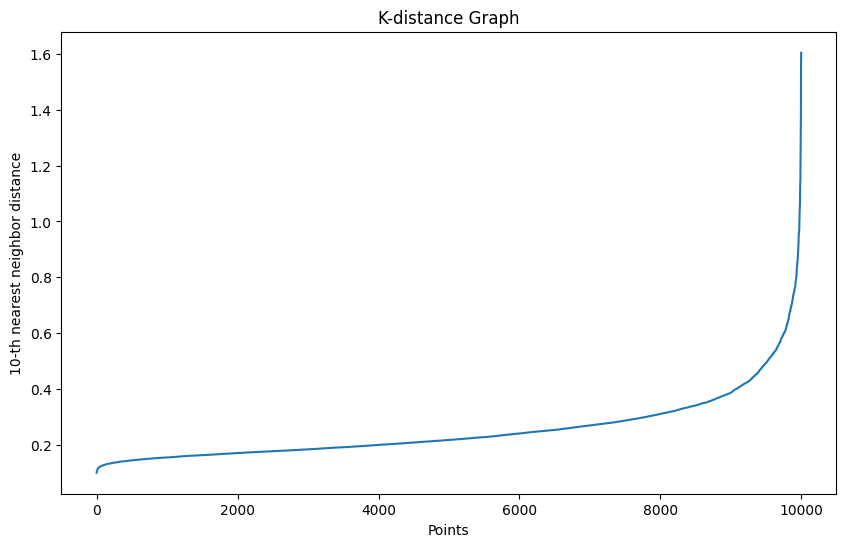

In [ ]:
plot_k_distance_graph(X_pca,k=10)

In [ ]:
dbscan_pca = DBSCAN(eps=0.4,min_samples=10)

In [ ]:
dbscan_pca.fit(X_pca)

DBSCAN(eps=0.4, min_samples=10)

In [ ]:
df_pca_dbscan = corr_dataset.copy()

In [ ]:
df_pca_dbscan["dbscan_pca"] = dbscan_pca.labels_

In [ ]:
y_true = df_pca_dbscan['target'].values  
y_kmeans = df_pca_dbscan['dbscan_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_dbscan['dbscan_pca'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_dbscan['dbscan_pca'] == y_true))

accuracy before: 0.961996199619962
accuracy after: 0.961996199619962


In [ ]:
df_pca_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_pca
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


In [ ]:
print(df_pca_dbscan['dbscan_pca'].value_counts())

dbscan_pca
 2    3225
 0    3215
 1    3179
-1     380
Name: count, dtype: int64


In [ ]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[   0    0    0    0]
 [ 118 3215    0    0]
 [ 154    0 3179    0]
 [ 108    0    0 3225]]


In [ ]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.96      0.98      3333
           1       1.00      0.95      0.98      3333
           2       1.00      0.97      0.98      3333

    accuracy                           0.96      9999
   macro avg       0.75      0.72      0.74      9999
weighted avg       1.00      0.96      0.98      9999



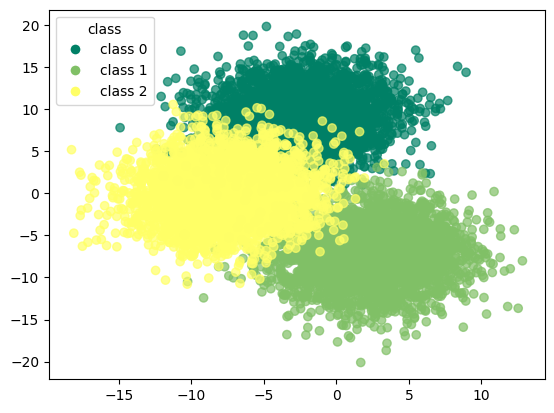

In [ ]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

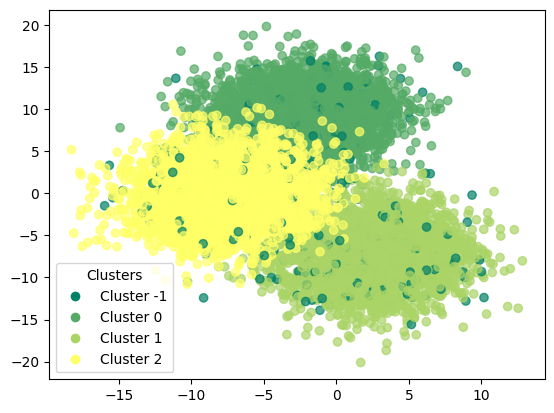

In [ ]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['dbscan_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_dbscan['dbscan_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with t-SNE

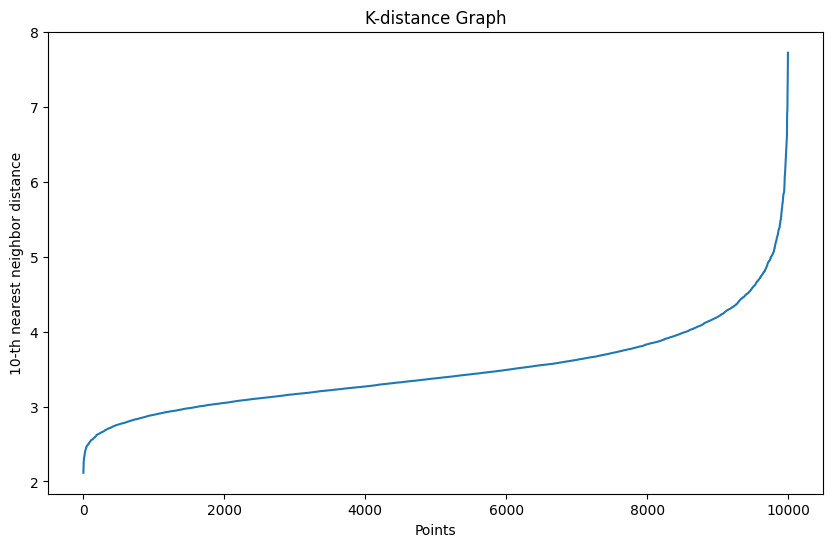

In [ ]:
plot_k_distance_graph(X_tsne,k=10)

In [ ]:
dbscan_tsne = DBSCAN(eps=3,min_samples=10)

In [ ]:
dbscan_tsne.fit(X_tsne)

DBSCAN(eps=3, min_samples=10)

In [ ]:
df_tsne_dbscan = corr_dataset.copy()

In [ ]:
df_tsne_dbscan['dbscan_tsne'] = dbscan_tsne.labels_

In [ ]:
y_true = df_tsne_dbscan['target'].values  
y_kmeans = df_tsne_dbscan['dbscan_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_dbscan['dbscan_tsne'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_dbscan['dbscan_tsne'] == y_true))

accuracy before: 0.013301330133013302
accuracy after: 0.014001400140014001


In [ ]:
df_tsne_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_tsne
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,32
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,20
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,1
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,1
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,-1
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,-1
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,164
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,190


In [ ]:
print(df_tsne_dbscan['dbscan_tsne'].value_counts())

dbscan_tsne
-1      4248
 0       140
 6       137
 1       133
 160     131
        ... 
 130       7
 134       7
 140       6
 133       6
 61        5
Name: count, Length: 223, dtype: int64


In [ ]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[   0    0    0 ...    0    0    0]
 [1452  140  133 ...    0    0    0]
 [1379    0    0 ...    0    0    0]
 ...
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]]


In [ ]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.04      0.08      3333
           1       0.00      0.00      0.00      3333
           2       0.00      0.00      0.00      3333
           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00         0
           5       0.00      0.00      0.00         0
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0
          12       0.00      0.00      0.00         0
          13       0.00      0.00      0.00         0
          14       0.00      0.00      0.00         0
          15       0.00      0.00      0.00         0
          16       0.00    

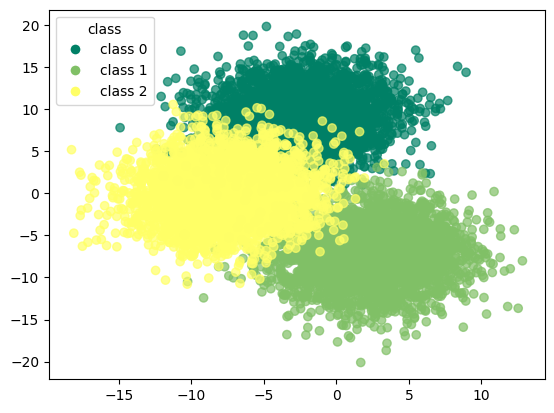

In [ ]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

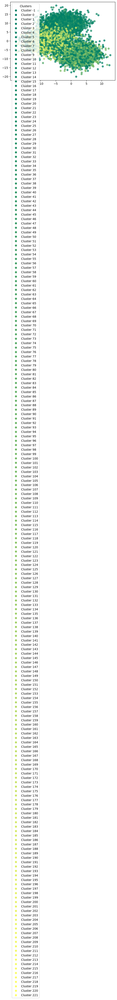

In [ ]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['dbscan_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_dbscan['dbscan_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with umap

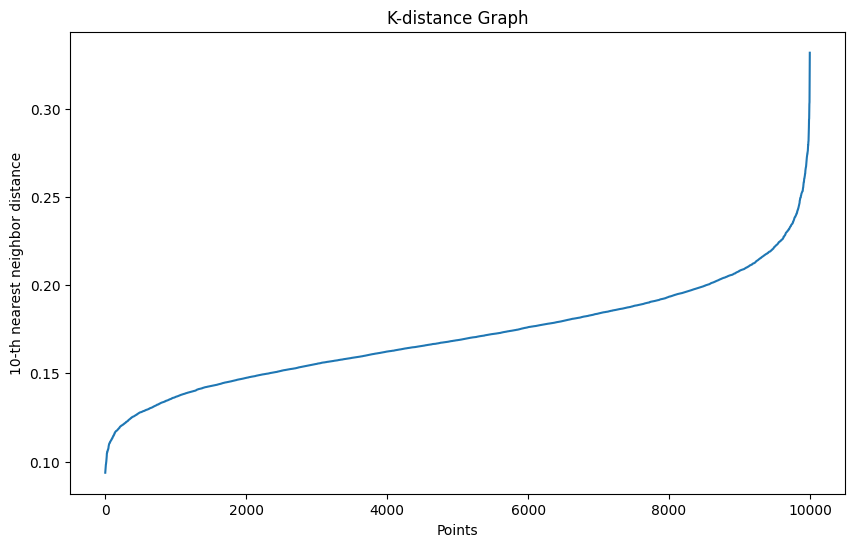

In [ ]:
plot_k_distance_graph(X_umap,k=10)

In [ ]:
dbscan_umap = DBSCAN(eps=0.6,min_samples=10)

In [ ]:
dbscan_umap.fit(X_umap)

DBSCAN(eps=0.6, min_samples=10)

In [ ]:
df_umap_dbscan = corr_dataset.copy()

In [ ]:
df_umap_dbscan['dbscan_umap'] = dbscan_umap.labels_

In [ ]:
y_true = df_umap_dbscan['target'].values  
y_kmeans = df_umap_dbscan['dbscan_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_dbscan['dbscan_umap'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_dbscan['dbscan_umap'] == y_true))

accuracy before: 1.0
accuracy after: 1.0


In [ ]:
df_umap_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_umap
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


In [ ]:
print(df_umap_dbscan['dbscan_umap'].value_counts())

dbscan_umap
0    3333
1    3333
2    3333
Name: count, dtype: int64


In [ ]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## GMM - Gaussian Mixture Models

In [ ]:
gmm = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [ ]:
gmm.fit(X_values)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [ ]:
df_gmm = corr_dataset.copy()

In [ ]:
df_gmm['gmm'] = gmm.predict(X_values)

In [ ]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,2
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,2
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,1
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,1
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,1
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,1


In [ ]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [ ]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


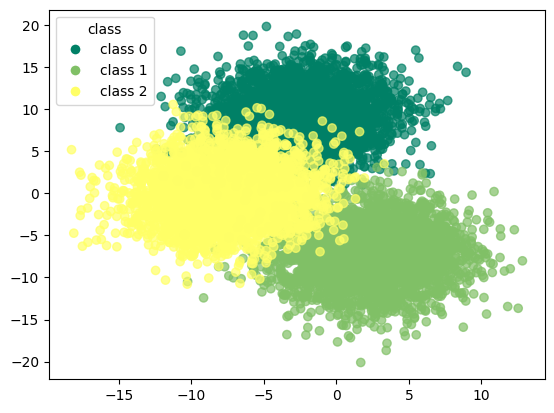

In [ ]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

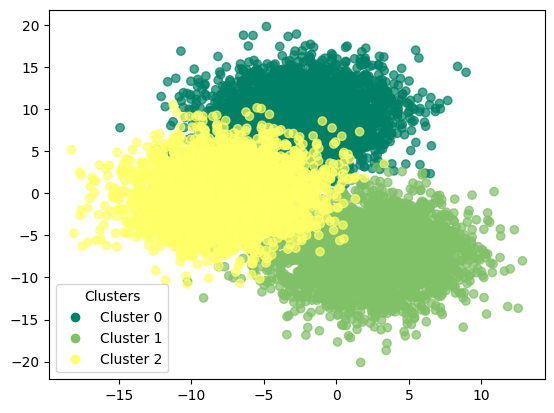

In [ ]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



### GMM with pca

In [ ]:
gmm_pca = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [ ]:
gmm_pca.fit(X_pca)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [ ]:
df_pca_gmm = corr_dataset.copy()

In [ ]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [ ]:
df_pca_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_pca
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,2
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,2
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,0
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,0
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,0
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,0


In [ ]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.0
accuracy after: 0.6026602660266026


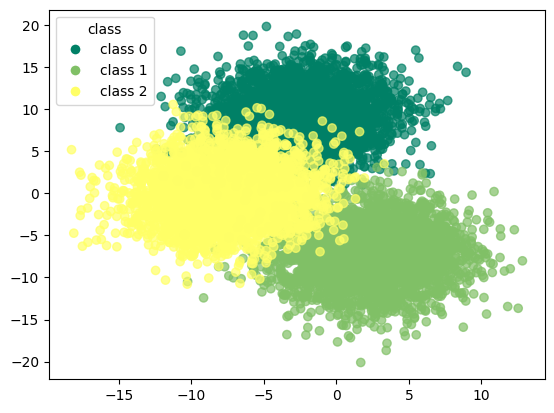

In [ ]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

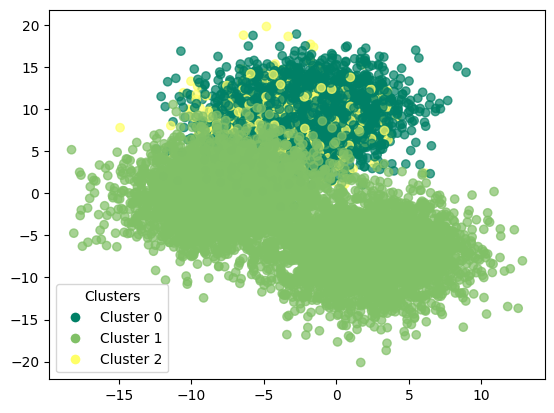

In [ ]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[2693    0  640]
 [   0 3333    0]
 [   0 3333    0]]


In [ ]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       1.00      0.81      0.89      3333
           1       0.50      1.00      0.67      3333
           2       0.00      0.00      0.00      3333

    accuracy                           0.60      9999
   macro avg       0.50      0.60      0.52      9999
weighted avg       0.50      0.60      0.52      9999



### GMM with t-SNE

In [ ]:
gmm_tsne = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [ ]:
gmm_tsne.fit(X_tsne)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [ ]:
df_tsne_gmm = corr_dataset.copy()

In [ ]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [ ]:
df_tsne_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_tsne
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,2
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,2
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,1
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,1
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,1
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,1


In [ ]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.0044004400440044
accuracy after: 0.9943994399439944


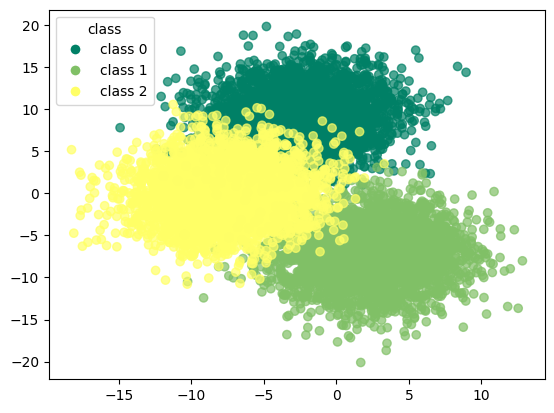

In [ ]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

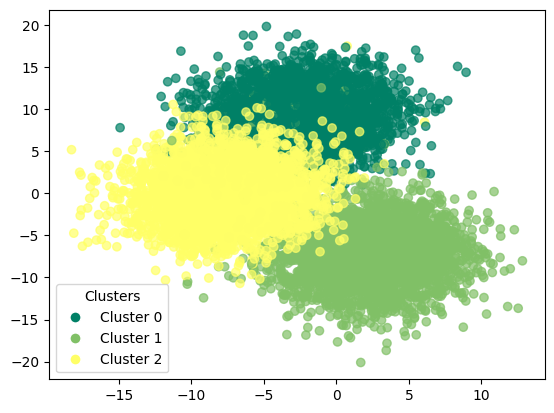

In [ ]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[3282   44    7]
 [   0 3333    0]
 [   0    5 3328]]


In [ ]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99      3333
           1       0.99      1.00      0.99      3333
           2       1.00      1.00      1.00      3333

    accuracy                           0.99      9999
   macro avg       0.99      0.99      0.99      9999
weighted avg       0.99      0.99      0.99      9999



### GMM with umap

In [ ]:
gmm_umap = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [ ]:
gmm_umap.fit(X_umap)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [ ]:
df_umap_gmm = corr_dataset.copy()

In [ ]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [ ]:
df_umap_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_umap
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,2
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,2
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,1
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,1
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,1
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,1


In [ ]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


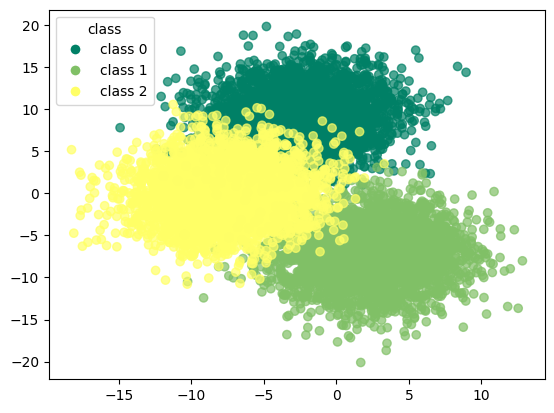

In [ ]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

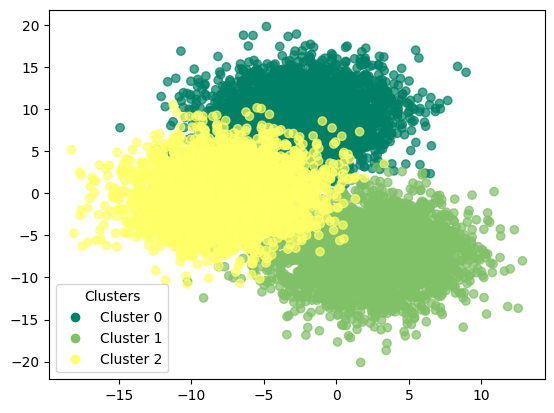

In [ ]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## pam

In [ ]:
initial_medoids = np.random.choice(len(X_values),3,replace=False)

In [ ]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [ ]:
pam = kmedoids(X_values,initial_medoids,metric=metric)

In [ ]:
pam.process()

In [ ]:
clusters = pam.get_clusters()

In [ ]:
medoids = pam.get_medoids()

In [ ]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [ ]:
df_pam = corr_dataset.copy()

In [ ]:
df_pam['pam'] = labels

In [ ]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,1.0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,1.0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,1.0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,1.0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,0.0
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,0.0
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,0.0
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,0.0


In [ ]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [ ]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


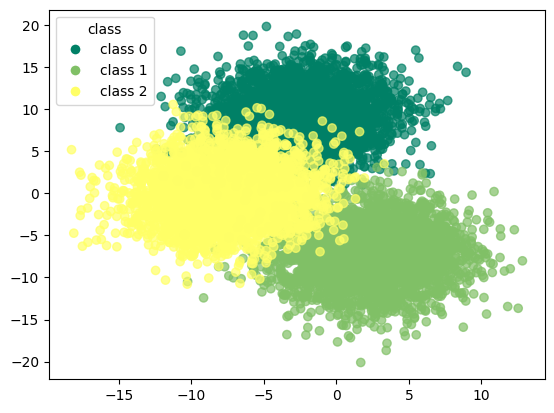

In [ ]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

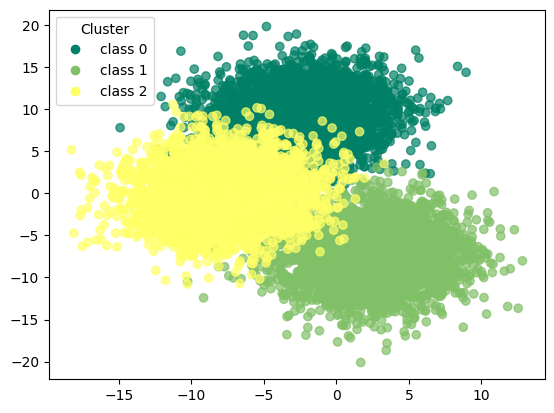

In [ ]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [ ]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



### pam with pca

In [ ]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [ ]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [ ]:
pam_pca = kmedoids(X_pca,initial_medoids,metric=metric)

In [ ]:
pam_pca.process()

In [ ]:
clusters = pam_pca.get_clusters()

In [ ]:
medoids = pam_pca.get_medoids()

In [ ]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [ ]:
df_pam_pca = corr_dataset.copy()

In [ ]:
df_pam_pca['pam_pca'] = labels

In [ ]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,2.0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,2.0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2.0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2.0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,1.0
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,1.0
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,1.0
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,1.0


In [ ]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [ ]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


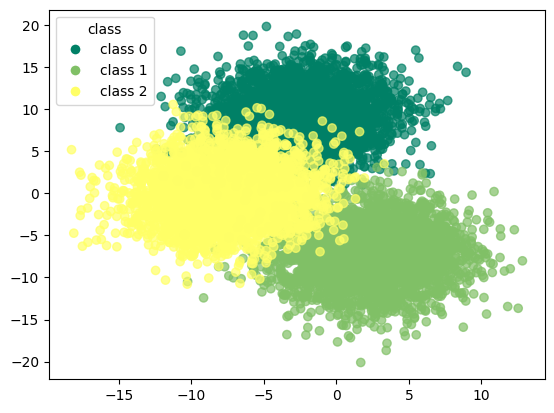

In [ ]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

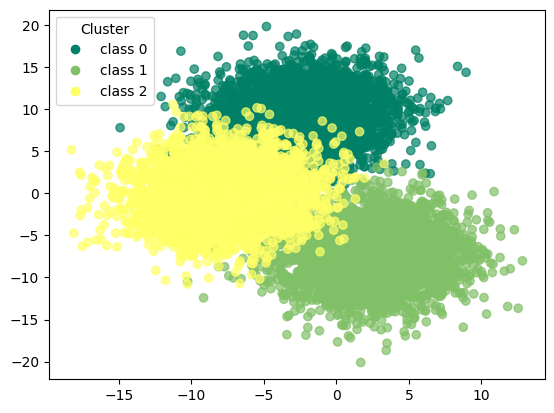

In [ ]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [ ]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



### pam with t-SNE

In [ ]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [ ]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [ ]:
pam_tsne = kmedoids(X_tsne,initial_medoids,metric=metric)

In [ ]:
pam_tsne.process()

In [ ]:
clusters = pam_tsne.get_clusters()

In [ ]:
medoids = pam_tsne.get_medoids()

In [ ]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [ ]:
df_pam_tsne = corr_dataset.copy()

In [ ]:
df_pam_tsne['pam_tsne'] = labels

In [ ]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0.0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0.0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0.0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0.0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2.0
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2.0
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2.0
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2.0


In [ ]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 0.9956995699569957
accuracy after: 0.9956995699569957


In [ ]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


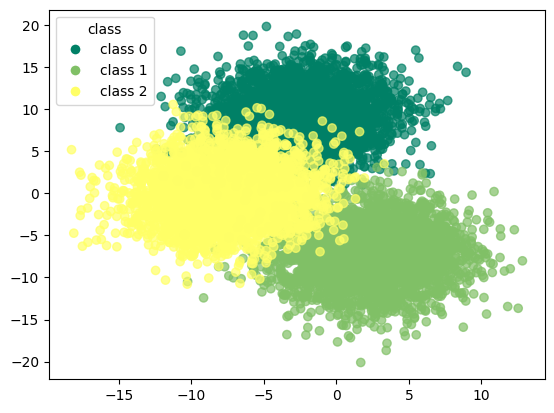

In [ ]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

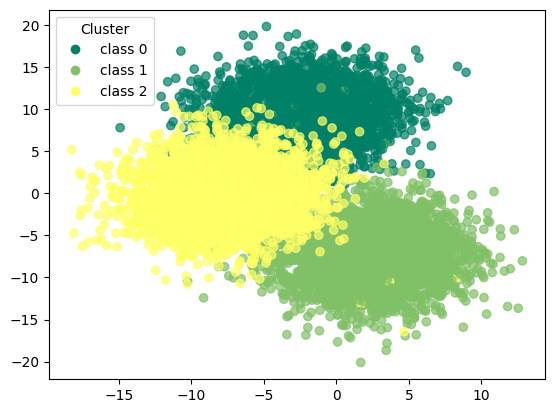

In [ ]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [ ]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[3303   24    6]
 [   0 3320   13]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      3333
           1       0.99      1.00      0.99      3333
           2       0.99      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



### pam with umap

In [ ]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [ ]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [ ]:
pam_umap = kmedoids(X_umap,initial_medoids,metric=metric)

In [ ]:
pam_umap.process()

In [ ]:
clusters = pam_umap.get_clusters()

In [ ]:
medoids = pam_umap.get_medoids()

In [ ]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [ ]:
df_pam_umap = corr_dataset.copy()

In [ ]:
df_pam_umap['pam_umap'] = labels

In [ ]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,1.0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,1.0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,1.0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,1.0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,0.0
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,0.0
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,0.0
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,0.0


In [ ]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [ ]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


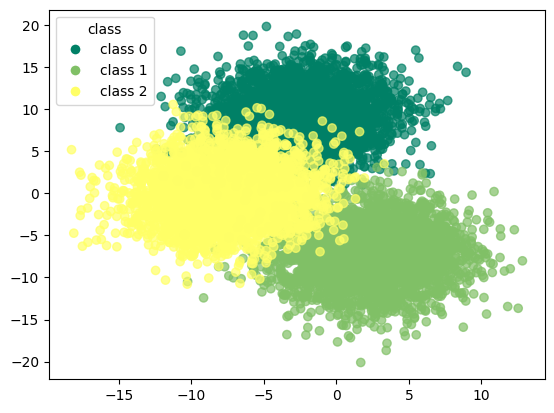

In [ ]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

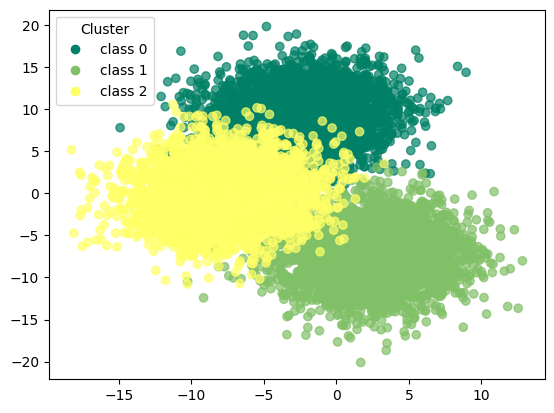

In [ ]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [ ]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## spectral clustering

In [ ]:
spectral_clustering = SpectralClustering(n_clusters=3,affinity ='rbf')

In [ ]:
spectral_clustering.fit(X_values)

NameError: name 'X_values' is not defined

In [ ]:
df_spectral = corr_dataset.copy()

In [ ]:
df_spectral['spectral_clustering'] = spectral_clustering.labels_

In [ ]:
df_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,2
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,2
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,1
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,1
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,1
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,1


In [ ]:
y_true = df_spectral['target'].values  
y_spectral = df_spectral['spectral_clustering'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_spectral['spectral_clustering'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_spectral['spectral_clustering'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [ ]:
df_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


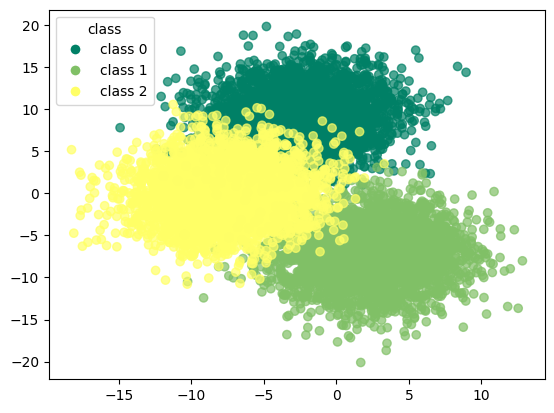

In [ ]:
scatter = plt.scatter(df_spectral.iloc[:, 0],df_spectral.iloc[:, 1], 
                      c=df_spectral['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_spectral['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

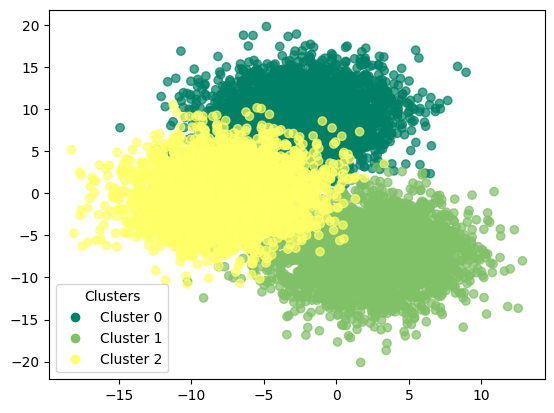

In [ ]:
scatter = plt.scatter(df_spectral.iloc[:, 0], df_spectral.iloc[:, 1], 
                      c=df_spectral['spectral_clustering'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_spectral['spectral_clustering'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
spectral_clustering.cluster_centers_

array([[ 0.95501043, -1.05990757, -0.18467896, -0.95216698,  0.82060342,
         0.79607234,  0.05189714, -0.50953478,  0.08858066, -0.81999477,
         0.17625607, -1.24508231, -1.30255281,  0.69990828,  1.0687009 ,
         0.46686771,  0.3715359 , -0.73407159,  0.9728878 ,  0.50510369],
       [-0.97658516, -0.08581553, -0.96863943,  1.0414553 , -0.16062926,
         0.40333641,  0.64850264, -0.50748958, -0.19595987, -0.39168048,
         1.03797545,  0.3592755 ,  0.78039196,  0.57479836,  0.05462788,
         0.79002428, -0.76587601, -0.30888016, -1.10990005, -0.15924856],
       [ 0.02157473,  1.1457231 ,  1.15331839, -0.08928832, -0.65997416,
        -1.19940875, -0.70039978,  1.01702436,  0.10737921,  1.21167525,
        -1.21423152,  0.8858068 ,  0.52216084, -1.27470664, -1.12332878,
        -1.25689198,  0.39434011,  1.04295175,  0.13701225, -0.34585512]])

In [ ]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



### spectral clustering with pca

In [ ]:
spectral_pca = SpectralClustering(n_clusters=3,affinity=42)

In [ ]:
spectral_pca.fit(X_pca)

KMeans(n_clusters=3, random_state=42)

In [ ]:
df_pca_spectral = corr_dataset.copy()

In [ ]:
df_pca_spectral["spectral_pca"] = spectral_pca.labels_

In [ ]:
df_pca_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,1
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,1
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,0
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,0
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,0
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,0


In [ ]:
y_true = df_pca_spectral['target'].values  
y_spectral_pca = df_pca_spectral['spectral_pca'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_pca)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_spectral['spectral_pca'] = np.array([mapping[label] for label in y_spectral_pca])

print("accuracy before:", np.mean(y_spectral_pca == y_true))
print("accuracy after:", np.mean(df_pca_spectral['spectral_pca'] == y_true))

accuracy before: 0.0
accuracy after: 0.5041504150415042


In [ ]:
df_pca_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,1
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,1
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,1
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,1


In [ ]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[1708    0 1625]
 [   0 3333    0]
 [   0 3333    0]]


In [ ]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       1.00      0.51      0.68      3333
           1       0.50      1.00      0.67      3333
           2       0.00      0.00      0.00      3333

    accuracy                           0.50      9999
   macro avg       0.50      0.50      0.45      9999
weighted avg       0.50      0.50      0.45      9999



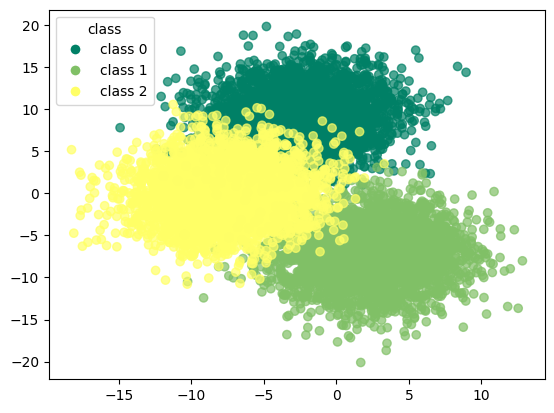

In [ ]:
scatter = plt.scatter(df_pca_spectral.iloc[:, 0], df_pca_spectral.iloc[:, 1], 
                      c=df_pca_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

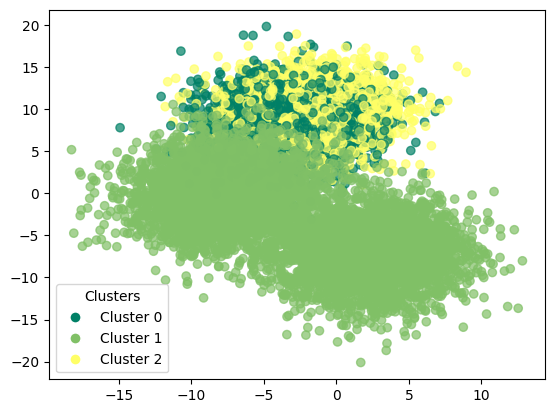

In [ ]:
scatter = plt.scatter(df_pca_spectral.iloc[:, 0], df_pca_spectral.iloc[:, 1], 
                      c=df_pca_spectral['spectral_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_spectral['spectral_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

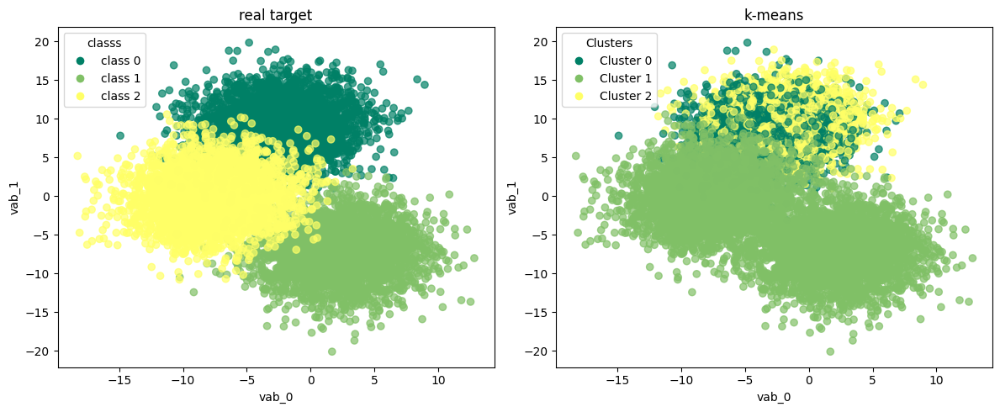

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_spectral.iloc[:, 0], df_pca_spectral.iloc[:, 1], 
                           c=df_pca_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_spectral['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_spectral.iloc[:, 0], df_pca_spectral.iloc[:, 1], 
                           c=df_pca_spectral['spectral_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_spectral['spectral_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("spectral clustering")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

### spectral clustering with t-SNE

In [ ]:
spectral_tsne = SpectralClustering(n_clusters=3,affinity=42)

In [ ]:
spectral_tsne.fit(X_tsne)

KMeans(n_clusters=3, random_state=42)

In [ ]:
df_tsne_spectral = corr_dataset.copy()

In [ ]:
df_tsne_spectral['spectral_tsne'] = spectral_tsne.labels_

In [ ]:
df_tsne_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,2
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,2
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,1
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,1
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,1
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,1


In [ ]:
y_true = df_tsne_spectral['target'].values  
y_spectral_tsne = df_tsne_spectral['spectral_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_tsne)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_spectral['spectral_tsne'] = np.array([mapping[label] for label in y_spectral_tsne])

print("accuracy before:", np.mean(y_spectral_tsne == y_true))
print("accuracy after:", np.mean(df_tsne_spectral['spectral_tsne'] == y_true))

accuracy before: 0.0033003300330033004
accuracy after: 0.9964996499649965


In [ ]:
df_tsne_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


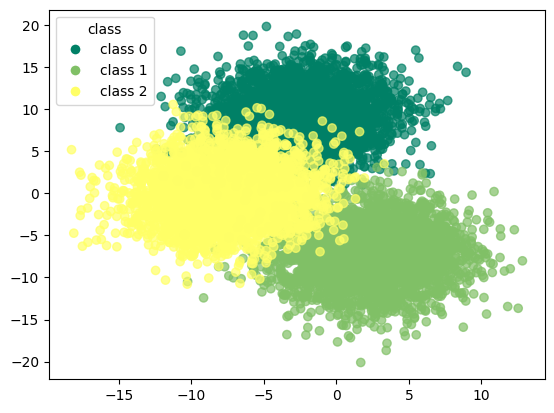

In [ ]:
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

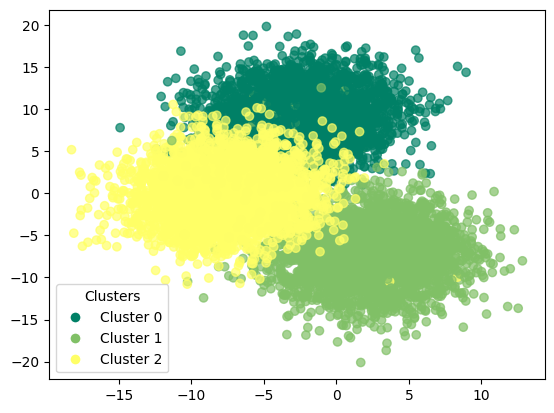

In [ ]:
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['spectral_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_spectral['spectral_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

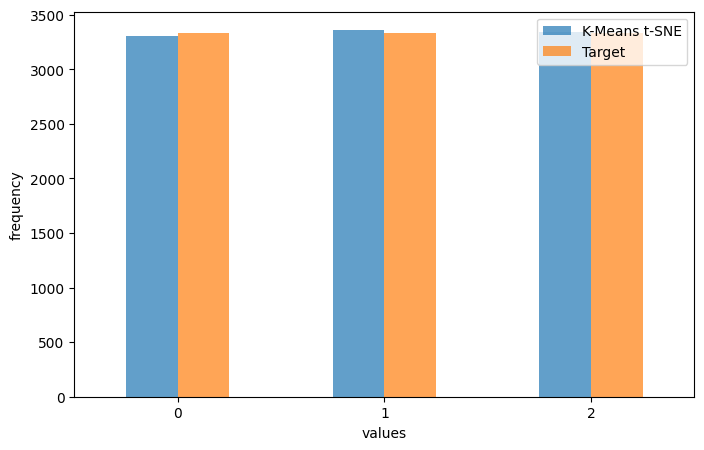

In [ ]:
counts_kmeans = df_tsne_spectral['spectral_tsne'].value_counts().sort_index()
counts_target = df_tsne_spectral['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'Spectral Clustering t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["Spectral Clustering T-sne", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [ ]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[3303   29    1]
 [   0 3329    4]
 [   0    1 3332]]


In [ ]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      3333
           1       0.99      1.00      0.99      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



### spectral clustering with umap

In [ ]:
spectral_umap = SpectralClustering(n_clusters=3,affinity=42)

In [ ]:
spectral_umap.fit(X_umap)

KMeans(n_clusters=3, random_state=42)

In [ ]:
df_umap_spectral = corr_dataset.copy()

In [ ]:
df_umap_spectral['spectral_umap'] = spectral_umap.labels_

In [ ]:
df_umap_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,2
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,2
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,2
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,2
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,1
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,1
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,1
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,1


In [ ]:
y_true = df_umap_spectral['target'].values  
y_spectral = df_umap_spectral['spectral_umap'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_spectral['spectral_umap'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_umap_spectral['spectral_umap'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [ ]:
df_umap_spectral

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,-5.152004,9.124349,8.018804,2.909264,-3.593232,-7.170291,-9.392568,3.986254,0.732290,4.812019,...,4.106921,-2.731575,-8.178097,-10.124234,-1.932494,0.666321,0.206354,-8.685204,0,0
1,0.776633,7.139438,-0.956529,-4.054445,-9.419401,-13.455876,-8.429588,6.968542,1.678403,1.004490,...,6.035455,-7.118252,-8.740804,-11.896706,-2.365136,-2.325526,-2.285224,-3.609069,0,0
2,-2.706756,7.837347,6.061989,2.985600,-6.972435,-8.129626,-6.761865,4.359043,2.322148,4.728814,...,4.943632,-3.328174,-3.815171,-10.766150,-3.478127,0.064453,1.617425,-1.288632,0,0
3,-1.831845,7.410481,3.966438,4.072164,-6.687061,-4.511670,-6.201272,8.042037,2.391284,2.192819,...,6.798002,-8.760151,-3.662339,-7.989494,-3.478067,0.965423,4.407371,0.681622,0,0
4,-0.190637,9.221953,6.432244,1.829044,-4.080903,-4.686219,-7.196596,8.747315,3.658733,6.821809,...,2.840858,-5.588362,-7.941978,-6.003940,-3.433710,-0.171449,-0.058949,-3.605684,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,-4.677455,-3.645803,-8.974268,8.842406,-1.318838,7.394712,-7.441952,-2.754346,7.863326,-11.675801,...,7.010298,6.893327,1.987985,8.618069,0.499451,-7.866530,-8.241748,-4.571805,2,2
9995,-9.818894,-2.279549,-10.627805,8.467228,-5.507880,2.429212,1.343342,-3.196335,-1.992973,-8.184132,...,5.118475,12.095014,3.449935,1.945385,-4.387963,-11.392284,-8.420734,-2.514598,2,2
9996,-15.227076,-4.736645,-8.243842,2.110539,-4.649238,1.493749,-4.114069,-0.522743,1.498673,-6.005086,...,9.068735,8.877587,-1.682355,3.393315,-3.681439,-1.337268,-14.706864,-3.746624,2,2
9997,-5.454461,3.202938,-5.268023,7.006287,-3.409112,4.557069,-4.723157,-2.494617,5.311604,-7.006290,...,12.974825,14.429359,-0.016353,5.918872,-12.139450,-6.083068,-13.410955,-0.592108,2,2


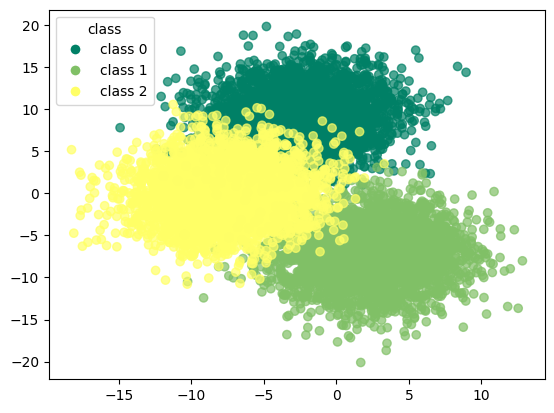

In [ ]:
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

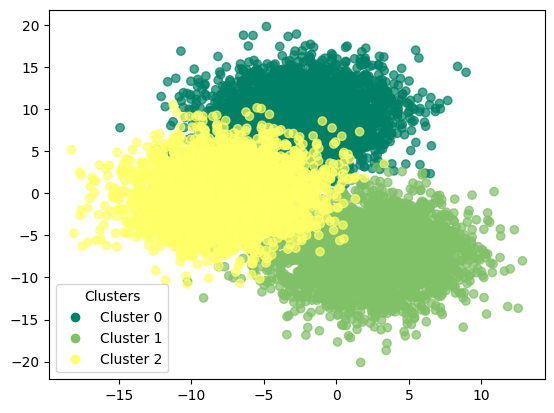

In [ ]:
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['spectral_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_spectral['spectral_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



# overall results k-means

## basic

In [ ]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



In [ ]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


## + pca

In [ ]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      0.51      0.68      3333
           1       0.50      1.00      0.67      3333
           2       0.00      0.00      0.00      3333

    accuracy                           0.50      9999
   macro avg       0.50      0.50      0.45      9999
weighted avg       0.50      0.50      0.45      9999



In [ ]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[1708    0 1625]
 [   0 3333    0]
 [   0 3333    0]]


## + t-SNE

In [ ]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      3333
           1       0.99      1.00      0.99      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



In [ ]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[3303   29    1]
 [   0 3329    4]
 [   0    1 3332]]


## + UMAP

In [ ]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



In [ ]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


# overall results trimmed k-means

## basic

In [ ]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3001
           1       1.00      1.00      1.00      2968
           2       1.00      1.00      1.00      3030

    accuracy                           1.00      8999
   macro avg       1.00      1.00      1.00      8999
weighted avg       1.00      1.00      1.00      8999



In [ ]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[3001    0    0]
 [   0 2968    0]
 [   0    0 3030]]


## + pca

In [ ]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.90      1.00      0.95      3001
           1       0.94      0.89      0.91      2968
           2       1.00      0.95      0.97      3030

    accuracy                           0.94      8999
   macro avg       0.95      0.94      0.94      8999
weighted avg       0.95      0.94      0.94      8999



In [ ]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[3001    0    0]
 [ 331 2637    0]
 [   0  165 2865]]


## + t-SNE

In [ ]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      3001
           1       0.97      0.97      0.97      2968
           2       1.00      0.98      0.99      3030

    accuracy                           0.98      8999
   macro avg       0.98      0.98      0.98      8999
weighted avg       0.98      0.98      0.98      8999



In [ ]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

[[2973   27    1]
 [  77 2888    3]
 [   0   62 2968]]


## + UMAP

In [ ]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2903
           1       1.00      1.00      1.00      3102
           2       1.00      1.00      1.00      2994

    accuracy                           1.00      8999
   macro avg       1.00      1.00      1.00      8999
weighted avg       1.00      1.00      1.00      8999



In [ ]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

[[2903    0    0]
 [   0 3102    0]
 [   0    0 2994]]


# overall results dbscan

## basic

In [ ]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    3333.0
           1       0.00      0.00      0.00    3333.0
           2       0.00      0.00      0.00    3333.0

    accuracy                           0.00    9999.0
   macro avg       0.00      0.00      0.00    9999.0
weighted avg       0.00      0.00      0.00    9999.0



In [ ]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0]
 [3333    0    0    0]
 [3333    0    0    0]
 [3333    0    0    0]]


## + pca

In [ ]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.96      0.98      3333
           1       1.00      0.95      0.98      3333
           2       1.00      0.97      0.98      3333

    accuracy                           0.96      9999
   macro avg       0.75      0.72      0.74      9999
weighted avg       1.00      0.96      0.98      9999



In [ ]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[   0    0    0    0]
 [ 118 3215    0    0]
 [ 154    0 3179    0]
 [ 108    0    0 3225]]


## + t-SNE

In [ ]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.04      0.08      3333
           1       0.00      0.00      0.00      3333
           2       0.00      0.00      0.00      3333
           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00         0
           5       0.00      0.00      0.00         0
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0
          12       0.00      0.00      0.00         0
          13       0.00      0.00      0.00         0
          14       0.00      0.00      0.00         0
          15       0.00      0.00      0.00         0
          16       0.00    

In [ ]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[   0    0    0 ...    0    0    0]
 [1452  140  133 ...    0    0    0]
 [1379    0    0 ...    0    0    0]
 ...
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]]


## + UMAP

In [ ]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



In [ ]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


# overall results GMM

## basic

In [ ]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



In [ ]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


## + pca

In [ ]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       1.00      0.81      0.89      3333
           1       0.50      1.00      0.67      3333
           2       0.00      0.00      0.00      3333

    accuracy                           0.60      9999
   macro avg       0.50      0.60      0.52      9999
weighted avg       0.50      0.60      0.52      9999



In [ ]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[2693    0  640]
 [   0 3333    0]
 [   0 3333    0]]


## + t-SNE

In [ ]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99      3333
           1       0.99      1.00      0.99      3333
           2       1.00      1.00      1.00      3333

    accuracy                           0.99      9999
   macro avg       0.99      0.99      0.99      9999
weighted avg       0.99      0.99      0.99      9999



In [ ]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[3282   44    7]
 [   0 3333    0]
 [   0    5 3328]]


## + UMAP

In [ ]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



In [ ]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


# overall results pam

## basic

In [ ]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## + pca

In [ ]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## + t-SNE

In [ ]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[3303   24    6]
 [   0 3320   13]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      3333
           1       0.99      1.00      0.99      3333
           2       0.99      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## + umap

In [ ]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



# overall results spectral clustering

## basic

In [ ]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## + pca

In [ ]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## + t-SNE

In [ ]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[3303   24    6]
 [   0 3320   13]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      3333
           1       0.99      1.00      0.99      3333
           2       0.99      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999



## + umap

In [ ]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[3333    0    0]
 [   0 3333    0]
 [   0    0 3333]]


In [ ]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3333
           1       1.00      1.00      1.00      3333
           2       1.00      1.00      1.00      3333

    accuracy                           1.00      9999
   macro avg       1.00      1.00      1.00      9999
weighted avg       1.00      1.00      1.00      9999

